<a href="https://colab.research.google.com/github/danarfthr/CV_FinalProject/blob/main/CV_FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Penglihatan Komputer dan Analisis Citra - Traffic Flow Violation

## Kelompok 1
| # | Nama | NIM |
|---|------|-----|
| 1 | Muhammad Dhiwaul Akbar | 23/523237/PA/22513 |
| 2 | Abdul Hamid Awaludin Ardiansyah | 24/540343/PA/22940 |
| 3 | Danar Fathurahman | 24/538200/PA/22828 |
| 4 | Kenji Ratanaputra | 24/534421/PA/22664 |
| 5 | Farsya Nabila Tori | 24/543855/PA/23113 |

Deteksi pelanggaran **melawan arus** pada rekaman CCTV Yogyakarta. Alur utama mengikuti proposal: **YOLOv8 + DeepSORT + ROI/RLB-CCTV + MBCDD**, lalu dilengkapi evaluasi **kuantitatif**, **kualitatif**, dan **method comparison**.

## 0. Cara Run Notebook

1. Mount Google Drive (https://drive.google.com/drive/u/0/folders/16CEnIgu7jOKx4vdNquip9Iagp0Xn3qbp, add shortcut ke dalam Google Drive pribadi ke MyDrive/PKAC/).
2. Ambil seluruh video dari folder `lawan_arus`, `pagi`, `siang`, `malam`.
3. Jalankan pipeline utama **YOLOv8 + DeepSORT + MBCDD**.
4. Simpan semua kandidat pelanggaran, bukti gambar, video anotasi, log, dan ringkasan ke Google Drive.
5. Lakukan satu-satunya tahap manual: review kandidat pada `review_queue.csv`.
6. Jalankan evaluasi kuantitatif, kualitatif, method comparison.

Output utama tersimpan di `/content/drive/MyDrive/PKAC/output_violations` agar tidak hilang saat runtime Colab restart.

## Struktur Dataset

Struktur data:

```text
MyDrive/PKAC/dataset_proyek/
├── pagi/       50 video normal
├── siang/      50 video normal
├── malam/      50 video normal
├── lawan_arus/ 10 video pelanggaran
└── demo/       1 video demo
```

## 1. Instalasi dan Import Library

In [ ]:
!pip install -q ultralytics deep_sort_realtime pandas tabulate ipywidgets

import os
import sys
import cv2
import time
import json
import math
import shutil
import warnings
from base64 import b64encode
from pathlib import Path
from dataclasses import dataclass, field
from typing import Any, Dict, List, Optional, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

try:
    from IPython.display import display, Markdown
except Exception:
    display = print
    Markdown = str

import torch
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort

warnings.filterwarnings("ignore")

print("Library siap")
print(f"Python   : {sys.version.split()[0]}")
print(f"OpenCV   : {cv2.__version__}")
print(f"PyTorch  : {torch.__version__}")
print(f"GPU      : {'tersedia' if torch.cuda.is_available() else 'tidak tersedia'}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 46.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 74.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 130.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Library siap
Python   : 3.12.13
OpenCV   : 4.13.0
PyTorch  : 2.11.0+cu128
GPU      : tersedia


## 2. Konfigurasi Global

In [ ]:
@dataclass
class Config:
    # Dataset dan output Google Drive
    dataset_dir: str = "/content/drive/MyDrive/PKAC/dataset_proyek"
    output_dir: str = "/content/output_violations"

    # Dataset structure
    video_path: Optional[str] = None
    batch_video_limit: Optional[int] = None
    expected_folder_counts: Dict[str, int] = field(default_factory=lambda: {"pagi": 50, "siang": 50, "malam": 50, "lawan_arus": 10, "demo": 1})

    # Kontrol visibilitas proses
    show_progress_bar: bool = True
    status_every_frames: int = 100
    show_direction_overlay: bool = True
    show_track_debug: bool = True

    # YOLOv8
    model_weights: str = "yolov8m.pt"
    yolo_conf: float = 0.40
    yolo_iou: float = 0.45
    yolo_classes: List[int] = field(default_factory=lambda: [2, 3, 5, 7])  # car, motorcycle, bus, truck

    # DeepSORT
    deepsort_max_age: int = 30
    deepsort_n_init: int = 3
    deepsort_max_iou: float = 0.7

    # MBCDD dan logika pelanggaran dibuat longgar agar motor lawan arus tidak terlewat.
    validation_seconds: int = 10
    min_track_frames: int = 8
    direction_window: int = 10
    wrong_way_angle_threshold: float = 90.0
    min_motion_px: float = 0.6
    min_violation_frames: int = 4
    min_net_displacement_px: float = 12.0
    violation_target_labels: List[str] = field(default_factory=lambda: ["motorcycle"])

    # Preprocessing / RLB-CCTV visualisasi
    brightness_thresh: int = 140
    gaussian_kernel: int = 9
    canny_low: int = 80
    canny_high: int = 200
    hough_threshold: int = 80
    hough_min_length: int = 60
    hough_max_gap: int = 20

    # ROI sudah dikalibrasi untuk CCTV yang sama.
    lane_polygons: Dict[int, List[Tuple[int, int]]] = field(default_factory=lambda: {
        1: [(0, 800), (320, 50), (450, 50), (1600, 800)]
    })

    # Output
    save_evidence: bool = True
    save_annotated_video: bool = True
    evidence_padding: int = 20

CFG = Config()
Path(CFG.output_dir).mkdir(parents=True, exist_ok=True)
print(json.dumps(CFG.__dict__, indent=2, default=str))

{
  "dataset_dir": "/content/drive/MyDrive/PKAC/dataset_proyek",
  "output_dir": "/content/output_violations",
  "video_path": null,
  "batch_video_limit": null,
  "expected_folder_counts": {
    "pagi": 50,
    "siang": 50,
    "malam": 50,
    "lawan_arus": 11
  },
  "show_progress_bar": true,
  "status_every_frames": 100,
  "show_direction_overlay": true,
  "show_track_debug": true,
  "model_weights": "yolov8m.pt",
  "yolo_conf": 0.4,
  "yolo_iou": 0.45,
  "yolo_classes": [
    2,
    3,
    5,
    7
  ],
  "deepsort_max_age": 30,
  "deepsort_n_init": 3,
  "deepsort_max_iou": 0.7,
  "validation_seconds": 10,
  "min_track_frames": 8,
  "direction_window": 10,
  "wrong_way_angle_threshold": 90.0,
  "min_motion_px": 0.6,
  "min_violation_frames": 4,
  "min_net_displacement_px": 12.0,
  "violation_target_labels": [
    "motorcycle"
  ],
  "brightness_thresh": 140,
  "gaussian_kernel": 9,
  "canny_low": 80,
  "canny_high": 200,
  "hough_threshold": 80,
  "hough_min_length": 60,
  "hough_

## 3. Mount Google Drive dan Pemilihan Video

In [ ]:
def mount_google_drive() -> None:
    """Mount Google Drive saat notebook dijalankan di Google Colab."""
    try:
        from google.colab import drive
        if not Path("/content/drive/MyDrive").exists():
            drive.mount("/content/drive")
        else:
            print("Google Drive sudah mounted.")
    except ModuleNotFoundError:
        print("Bukan environment Google Colab. Pastikan CFG.dataset_dir mengarah ke folder dataset lokal yang benar.")


def validate_dataset_structure(cfg: Config) -> None:
    dataset_path = Path(cfg.dataset_dir)
    expected_folders = list(cfg.expected_folder_counts.keys())

    if not dataset_path.exists():
        raise FileNotFoundError(
            f"Dataset tidak ditemukan: {cfg.dataset_dir}\n"
            "Pastikan Google Drive sudah mounted dan dataset berada di:\n"
            "/content/drive/MyDrive/PKAC/dataset_proyek"
        )

    missing = [folder for folder in expected_folders if not (dataset_path / folder).exists()]
    if missing:
        raise FileNotFoundError(
            f"Subfolder dataset belum lengkap: {missing}\n"
            "Struktur yang diharapkan: pagi, siang, malam, lawan_arus."
        )

    print(f"Dataset ditemukan: {cfg.dataset_dir}")
    for folder in expected_folders:
        n_videos = len(list((dataset_path / folder).glob("*.mp4")))
        expected = cfg.expected_folder_counts[folder]
        status = "OK" if n_videos == expected else f"Cek jumlah, expected {expected}"
        print(f"  - {folder:<10}: {n_videos:>3} video ({status})")


def discover_videos(dataset_dir: str) -> pd.DataFrame:
    rows = []
    for path in sorted(Path(dataset_dir).rglob("*.mp4")):
        cap = cv2.VideoCapture(str(path))
        fps = cap.get(cv2.CAP_PROP_FPS) or 0
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) or 0)
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) or 0)
        cap.release()
        rows.append({
            "video_path": str(path),
            "folder": path.parent.name,
            "filename": path.name,
            "fps": fps,
            "frames": frame_count,
            "duration_sec": round(frame_count / fps, 2) if fps else 0,
            "resolution": f"{width}x{height}",
        })
    return pd.DataFrame(rows)


mount_google_drive()
validate_dataset_structure(CFG)
videos_df = discover_videos(CFG.dataset_dir)
print(f"Jumlah video ditemukan: {len(videos_df)}")
display(videos_df.head(20))

if CFG.video_path and Path(CFG.video_path).exists():
    SELECTED_VIDEO = CFG.video_path
elif len(videos_df) > 0:
    SELECTED_VIDEO = videos_df.iloc[0]["video_path"]
else:
    SELECTED_VIDEO = None

print(f"Video terpilih sementara: {SELECTED_VIDEO}")

Mounted at /content/drive
Dataset ditemukan: /content/drive/MyDrive/PKAC/dataset_proyek
  - pagi      :  50 video (OK)
  - siang     :  50 video (OK)
  - malam     :  50 video (OK)
  - lawan_arus:  10 video (Cek jumlah, expected 11)
Jumlah video ditemukan: 161


,video_path,folder,filename,fps,frames,duration_sec,resolution
0,/content/drive/MyDrive/PKAC/dataset_proyek/dem...,demo,output236.mp4,25.033333,751,30.0,1280x720
1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,CCTV_Gardena_Malam_LawanArus.mp4,25.033333,751,30.0,1280x720
2,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output100.mp4,25.033333,751,30.0,1280x720
3,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output113.mp4,25.033333,751,30.0,1280x720
4,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output152.mp4,25.033333,751,30.0,1280x720
5,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output188.mp4,25.033333,751,30.0,1280x720
6,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output192.mp4,25.033333,751,30.0,1280x720
7,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output200.mp4,25.032499,751,30.0,1280x720
8,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output230.mp4,25.033333,751,30.0,1280x720
9,/content/drive/MyDrive/PKAC/dataset_proyek/law...,lawan_arus,output86.mp4,25.033333,751,30.0,1280x720


Video terpilih sementara: /content/drive/MyDrive/PKAC/dataset_proyek/demo/output236.mp4


## 3.1 Dashboard Dataset dan Pemilihan Video Utama

Workflow default memproses semua video pada folder `lawan_arus`, `pagi`, `siang`, `malam`.

In [ ]:
def dataset_dashboard(videos_df: pd.DataFrame, cfg: Config) -> pd.DataFrame:
    if videos_df.empty:
        print("Dataset kosong. Pastikan folder dataset_proyek sudah berisi subfolder video.")
        return pd.DataFrame()

    summary = (
        videos_df.groupby("folder")
        .agg(
            jumlah_video=("video_path", "count"),
            total_durasi_detik=("duration_sec", "sum"),
            rata_durasi_detik=("duration_sec", "mean"),
            rata_fps=("fps", "mean"),
        )
        .reset_index()
    )
    summary["expected"] = summary["folder"].map(cfg.expected_folder_counts)
    summary["status"] = summary.apply(
        lambda r: "OK" if pd.isna(r["expected"]) or int(r["jumlah_video"]) == int(r["expected"]) else f"Cek: expected {int(r['expected'])}",
        axis=1,
    )
    display(summary)
    return summary


def get_videos_by_scenario(videos_df: pd.DataFrame, scenario: str, limit: Optional[int] = None) -> List[str]:
    subset = videos_df[videos_df["folder"] == scenario].sort_values("filename").reset_index(drop=True)
    if limit is not None:
        subset = subset.head(limit)
    return subset["video_path"].tolist()


dataset_summary_df = dataset_dashboard(videos_df, CFG)
MAIN_SCENARIOS = ["pagi", "siang", "malam", "lawan_arus"]

MAIN_VIDEO_PATHS = (
    videos_df[videos_df["folder"].isin(MAIN_SCENARIOS)]
    .sort_values(["folder", "filename"])
    .groupby("folder", group_keys=False)
    .head(10)
    ["video_path"]
    .tolist()
)

SELECTED_VIDEO = MAIN_VIDEO_PATHS[0] if MAIN_VIDEO_PATHS else None

print(f"Scenario utama     : {MAIN_SCENARIOS}")
print(f"Jumlah video utama : {len(MAIN_VIDEO_PATHS)}")
print(f"Video preview      : {SELECTED_VIDEO}")

display(pd.DataFrame({"video_path": MAIN_VIDEO_PATHS}))

,folder,jumlah_video,total_durasi_detik,rata_durasi_detik,rata_fps,expected,status
0,demo,1,30.0,30.0,25.033333,NaN,OK
1,lawan_arus,10,300.0,30.0,25.033250,11.0,Cek: expected 11
2,malam,50,0.0,0.0,0.000000,50.0,OK
3,pagi,50,0.0,0.0,0.000000,50.0,OK
4,siang,50,0.0,0.0,0.000000,50.0,OK


Scenario utama     : ['pagi', 'siang', 'malam', 'lawan_arus']
Jumlah video utama : 40
Video preview      : /content/drive/MyDrive/PKAC/dataset_proyek/lawan_arus/CCTV_Gardena_Malam_LawanArus.mp4


,video_path
0,/content/drive/MyDrive/PKAC/dataset_proyek/law...
1,/content/drive/MyDrive/PKAC/dataset_proyek/law...
2,/content/drive/MyDrive/PKAC/dataset_proyek/law...
3,/content/drive/MyDrive/PKAC/dataset_proyek/law...
4,/content/drive/MyDrive/PKAC/dataset_proyek/law...
5,/content/drive/MyDrive/PKAC/dataset_proyek/law...
6,/content/drive/MyDrive/PKAC/dataset_proyek/law...
7,/content/drive/MyDrive/PKAC/dataset_proyek/law...
8,/content/drive/MyDrive/PKAC/dataset_proyek/law...
9,/content/drive/MyDrive/PKAC/dataset_proyek/law...


## 4. Utilitas Visualisasi dan Metadata

,path,filename,fps,frame_count,width,height,duration_sec
0,/content/drive/MyDrive/PKAC/dataset_proyek/law...,CCTV_Gardena_Malam_LawanArus.mp4,25.033333,751,1280,720,30.0


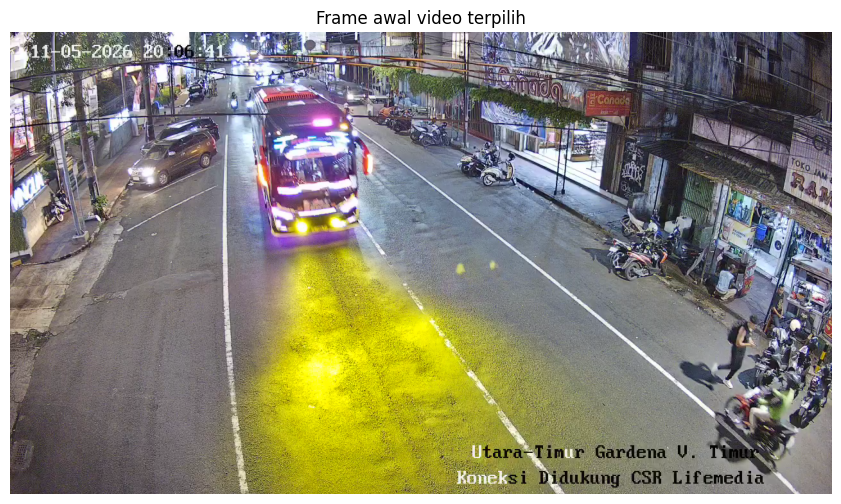

In [ ]:
def get_video_metadata(video_path: str) -> Dict[str, Any]:
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise FileNotFoundError(f"Tidak dapat membuka video: {video_path}")
    fps = cap.get(cv2.CAP_PROP_FPS) or 0
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    info = {
        "path": video_path,
        "filename": Path(video_path).name,
        "fps": fps,
        "frame_count": frame_count,
        "width": int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) or 0),
        "height": int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) or 0),
        "duration_sec": frame_count / fps if fps else 0,
    }
    cap.release()
    return info


def read_frame(video_path: str, frame_index: int = 0) -> np.ndarray:
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ret, frame = cap.read()
    cap.release()
    if not ret:
        raise RuntimeError(f"Tidak dapat membaca frame {frame_index} dari {video_path}")
    return frame


def show_bgr(frame: np.ndarray, title: str = "Frame", figsize: Tuple[int, int] = (12, 6)) -> None:
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()


if SELECTED_VIDEO:
    VIDEO_INFO = get_video_metadata(SELECTED_VIDEO)
    display(pd.DataFrame([VIDEO_INFO]))
    show_bgr(read_frame(SELECTED_VIDEO), "Frame awal video terpilih")
else:
    print("Belum ada video. Pastikan Google Drive sudah mounted dan dataset tersedia di MyDrive/PKAC/dataset_proyek.")

## 4.1 Utilitas Visibilitas Proses

Cell ini membantu melihat proses secara eksplisit: ringkasan status frame, panah arah dominan, galeri kandidat pelanggaran, dan video preview di notebook.

In [ ]:
def draw_arrow(vis: np.ndarray, start: Tuple[int, int], vector: Tuple[float, float], color=(255, 255, 0), scale: float = 5.0, label: str = "") -> np.ndarray:
    x, y = start
    dx, dy = vector
    end = (int(x + dx * scale), int(y + dy * scale))
    cv2.arrowedLine(vis, (int(x), int(y)), end, color, 3, tipLength=0.25)
    if label:
        cv2.putText(vis, label, (int(x) + 8, int(y) - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    return vis


def preview_video(video_path: str, width: int = 720) -> None:
    if not video_path or not Path(video_path).exists():
        print("Video preview tidak tersedia.")
        return
    video_bytes = Path(video_path).read_bytes()
    encoded = b64encode(video_bytes).decode("ascii")
    display(Markdown(f'<video width="{width}" controls><source src="data:video/mp4;base64,{encoded}" type="video/mp4"></video>'))


def show_status_snapshot(logs_df: pd.DataFrame, last_n: int = 10) -> None:
    if logs_df is None or logs_df.empty:
        print("Belum ada log frame.")
        return
    cols = ["frame_idx", "time_sec", "phase", "detections", "active_tracks", "runtime_fps"]
    display(logs_df[cols].tail(last_n))


def show_candidate_gallery(review_df: pd.DataFrame, max_items: int = 12, cols: int = 3) -> None:
    if review_df is None or review_df.empty:
        print("Belum ada kandidat pelanggaran.")
        return
    subset = review_df.head(max_items).reset_index(drop=True)
    rows = math.ceil(len(subset) / cols)
    plt.figure(figsize=(5 * cols, 4 * rows))
    for i, row in subset.iterrows():
        plt.subplot(rows, cols, i + 1)
        path = row.get("evidence_path")
        if isinstance(path, str) and Path(path).exists():
            img = cv2.imread(path)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        else:
            plt.text(0.5, 0.5, "No evidence", ha="center", va="center")
        plt.title(f"Event {row.get('event_id')} | t={row.get('time_sec')}s | angle={row.get('angle_diff')}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

## 5. ROI dan Prapemrosesan RLB-CCTV

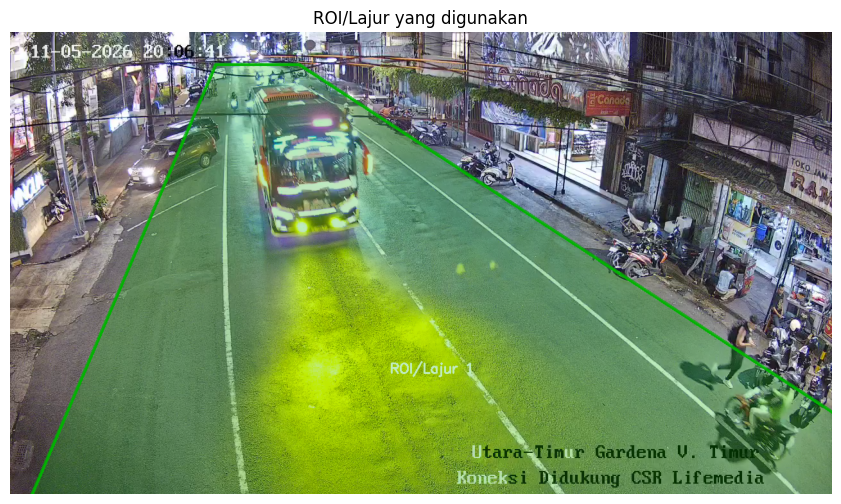

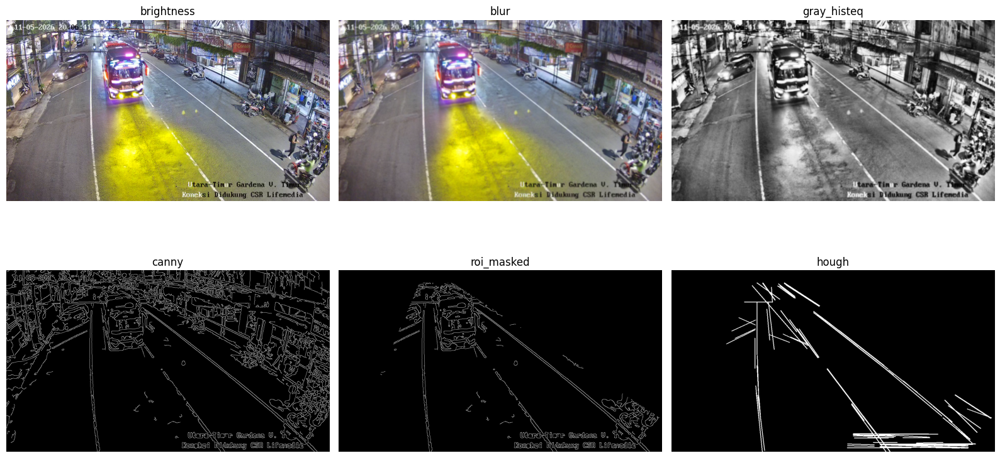

In [ ]:
class LaneSegmentation:
    def __init__(self, cfg: Config):
        self.cfg = cfg
        self.lane_polygons = {
            int(lid): np.array(points, dtype=np.int32)
            for lid, points in cfg.lane_polygons.items()
        }

    def get_lane_id(self, point: Tuple[int, int]) -> int:
        for lane_id, polygon in self.lane_polygons.items():
            inside = cv2.pointPolygonTest(polygon, (float(point[0]), float(point[1])), False)
            if inside >= 0:
                return lane_id
        return -1

    def draw_lanes(self, frame: np.ndarray) -> np.ndarray:
        vis = frame.copy()
        overlay = frame.copy()
        colors = [(0, 180, 0), (255, 160, 0), (180, 0, 255), (0, 180, 255)]
        for idx, (lane_id, polygon) in enumerate(self.lane_polygons.items()):
            color = colors[idx % len(colors)]
            cv2.fillPoly(overlay, [polygon], color)
            cv2.polylines(vis, [polygon], True, color, 3)
            m = cv2.moments(polygon)
            if m["m00"]:
                cx, cy = int(m["m10"] / m["m00"]), int(m["m01"] / m["m00"])
                cv2.putText(vis, f"ROI/Lajur {lane_id}", (cx - 60, cy), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
        return cv2.addWeighted(overlay, 0.25, vis, 0.75, 0)


class ImagePreprocessing:
    def __init__(self, cfg: Config, lane_segmentation: LaneSegmentation):
        self.cfg = cfg
        self.seg = lane_segmentation

    def adjust_brightness(self, frame: np.ndarray) -> np.ndarray:
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV).astype(np.int32)
        mean_v = float(np.mean(hsv[:, :, 2]))
        if mean_v < self.cfg.brightness_thresh:
            hsv[:, :, 2] = np.clip(hsv[:, :, 2] + int(self.cfg.brightness_thresh - mean_v), 0, 255)
        return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)

    def run(self, frame: np.ndarray) -> Dict[str, np.ndarray]:
        bright = self.adjust_brightness(frame)
        k = self.cfg.gaussian_kernel + (1 if self.cfg.gaussian_kernel % 2 == 0 else 0)
        blur = cv2.GaussianBlur(bright, (k, k), 0)
        lab = cv2.cvtColor(blur, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        l_eq = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(l)
        gray = cv2.cvtColor(cv2.merge([l_eq, a, b]), cv2.COLOR_LAB2BGR)
        gray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)
        canny = cv2.Canny(gray, self.cfg.canny_low, self.cfg.canny_high)
        mask = np.zeros_like(canny)
        for polygon in self.seg.lane_polygons.values():
            cv2.fillPoly(mask, [polygon], 255)
        masked = cv2.bitwise_and(canny, mask)
        hough = np.zeros_like(masked)
        lines = cv2.HoughLinesP(masked, 1, np.pi / 180, threshold=self.cfg.hough_threshold,
                               minLineLength=self.cfg.hough_min_length, maxLineGap=self.cfg.hough_max_gap)
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough, (x1, y1), (x2, y2), 255, 2)
        return {"brightness": bright, "blur": blur, "gray_histeq": gray, "canny": canny, "roi_masked": masked, "hough": hough}

    def visualize(self, results: Dict[str, np.ndarray]) -> None:
        keys = list(results.keys())
        plt.figure(figsize=(16, 9))
        for i, key in enumerate(keys, 1):
            plt.subplot(2, 3, i)
            img = results[key]
            if len(img.shape) == 2:
                plt.imshow(img, cmap="gray")
            else:
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(key)
            plt.axis("off")
        plt.tight_layout()
        plt.show()


if SELECTED_VIDEO:
    seg = LaneSegmentation(CFG)
    sample_frame = read_frame(SELECTED_VIDEO)
    show_bgr(seg.draw_lanes(sample_frame), "ROI/Lajur yang digunakan")
    prep = ImagePreprocessing(CFG, seg)
    prep.visualize(prep.run(sample_frame))

## 6. Deteksi, Tracking, dan Deteksi Arah

In [ ]:
@dataclass
class TrackInfo:
    track_id: int
    centroids: List[Tuple[int, int]] = field(default_factory=list)
    frames_seen: int = 0
    lane_votes: List[int] = field(default_factory=list)
    label: str = "vehicle"
    conf_values: List[float] = field(default_factory=list)
    is_flagged: bool = False
    violation_frames: int = 0
    first_violation_frame: Optional[int] = None
    evidence_path: Optional[str] = None

    @property
    def lane_id(self) -> int:
        valid = [lane for lane in self.lane_votes if lane != -1]
        if not valid:
            return -1
        return max(set(valid), key=valid.count)


@dataclass
class LaneDirectionInfo:
    lane_id: int
    mean_dx: float
    mean_dy: float
    std_dx: float
    std_dy: float
    dominant_angle_deg: float
    n_tracks: int


class VehicleDetector:
    VEHICLE_LABELS = {2: "car", 3: "motorcycle", 5: "bus", 7: "truck"}

    def __init__(self, cfg: Config):
        self.cfg = cfg
        self.model = YOLO(cfg.model_weights)

    def detect(self, frame: np.ndarray) -> List[Dict[str, Any]]:
        results = self.model.predict(frame, conf=self.cfg.yolo_conf, iou=self.cfg.yolo_iou,
                                     classes=self.cfg.yolo_classes, verbose=False)
        detections = []
        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                cls = int(box.cls[0])
                conf = float(box.conf[0])
                detections.append({
                    "bbox": [x1, y1, x2, y2],
                    "ltwh": [x1, y1, max(1, x2 - x1), max(1, y2 - y1)],
                    "conf": conf,
                    "cls": cls,
                    "label": self.VEHICLE_LABELS.get(cls, str(cls)),
                    "cx": (x1 + x2) // 2,
                    "cy": (y1 + y2) // 2,
                })
        return detections


class DeepSortTracker:
    def __init__(self, cfg: Config, seg: LaneSegmentation):
        self.cfg = cfg
        self.seg = seg
        self.tracker = DeepSort(max_age=cfg.deepsort_max_age, n_init=cfg.deepsort_n_init,
                                max_iou_distance=cfg.deepsort_max_iou)
        self.tracks: Dict[int, TrackInfo] = {}

    def update(self, frame: np.ndarray, detections: List[Dict[str, Any]]) -> List[Dict[str, Any]]:
        raw = [(d["ltwh"], d["conf"], d["label"]) for d in detections]
        track_objects = self.tracker.update_tracks(raw, frame=frame)
        active = []
        for trk in track_objects:
            if not trk.is_confirmed():
                continue
            tid = int(trk.track_id)
            x1, y1, x2, y2 = map(int, trk.to_ltrb())
            cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
            lane_id = self.seg.get_lane_id((cx, cy))
            if tid not in self.tracks:
                self.tracks[tid] = TrackInfo(track_id=tid)
            info = self.tracks[tid]
            info.centroids.append((cx, cy))
            info.frames_seen += 1
            info.lane_votes.append(lane_id)
            info.label = trk.get_det_class() or info.label
            det_conf = trk.get_det_conf()
            if det_conf is not None:
                info.conf_values.append(float(det_conf))
            active.append({"track_id": tid, "bbox": [x1, y1, x2, y2], "cx": cx, "cy": cy, "lane_id": lane_id, "label": info.label})
        return active

    def get_direction_vector(self, track_id: int, window: Optional[int] = None) -> Optional[Tuple[float, float]]:
        info = self.tracks.get(track_id)
        if not info or len(info.centroids) < 2:
            return None
        pts = info.centroids[-(window or self.cfg.direction_window):]
        if len(pts) < 2:
            return None
        dx = float(np.mean(np.diff([p[0] for p in pts])))
        dy = float(np.mean(np.diff([p[1] for p in pts])))
        return dx, dy

    def get_valid_tracks(self) -> Dict[int, TrackInfo]:
        return {tid: t for tid, t in self.tracks.items() if t.frames_seen >= self.cfg.min_track_frames and t.lane_id != -1}


class CentroidTracker:
    """Baseline sederhana untuk method comparison."""
    def __init__(self, cfg: Config, seg: LaneSegmentation, max_distance: float = 80.0):
        self.cfg = cfg
        self.seg = seg
        self.max_distance = max_distance
        self.next_id = 1
        self.tracks: Dict[int, TrackInfo] = {}
        self.last_centroids: Dict[int, Tuple[int, int]] = {}
        self.missed: Dict[int, int] = {}

    def update(self, frame: np.ndarray, detections: List[Dict[str, Any]]) -> List[Dict[str, Any]]:
        active = []
        used_track_ids = set()
        for det in detections:
            centroid = (det["cx"], det["cy"])
            best_tid, best_dist = None, float("inf")
            for tid, last in self.last_centroids.items():
                if tid in used_track_ids:
                    continue
                dist = math.hypot(centroid[0] - last[0], centroid[1] - last[1])
                if dist < best_dist:
                    best_tid, best_dist = tid, dist
            if best_tid is None or best_dist > self.max_distance:
                best_tid = self.next_id
                self.next_id += 1
                self.tracks[best_tid] = TrackInfo(track_id=best_tid)
            used_track_ids.add(best_tid)
            self.last_centroids[best_tid] = centroid
            self.missed[best_tid] = 0
            info = self.tracks[best_tid]
            lane_id = self.seg.get_lane_id(centroid)
            info.centroids.append(centroid)
            info.frames_seen += 1
            info.lane_votes.append(lane_id)
            info.label = det["label"]
            info.conf_values.append(det["conf"])
            active.append({"track_id": best_tid, "bbox": det["bbox"], "cx": centroid[0], "cy": centroid[1], "lane_id": lane_id, "label": det["label"]})

        for tid in list(self.last_centroids):
            if tid not in used_track_ids:
                self.missed[tid] = self.missed.get(tid, 0) + 1
                if self.missed[tid] > self.cfg.deepsort_max_age:
                    self.last_centroids.pop(tid, None)
        return active

    def get_direction_vector(self, track_id: int, window: Optional[int] = None) -> Optional[Tuple[float, float]]:
        info = self.tracks.get(track_id)
        if not info or len(info.centroids) < 2:
            return None
        pts = info.centroids[-(window or self.cfg.direction_window):]
        dx = float(np.mean(np.diff([p[0] for p in pts])))
        dy = float(np.mean(np.diff([p[1] for p in pts])))
        return dx, dy

    def get_valid_tracks(self) -> Dict[int, TrackInfo]:
        return {tid: t for tid, t in self.tracks.items() if t.frames_seen >= self.cfg.min_track_frames and t.lane_id != -1}


class MBCDD:
    def __init__(self, cfg: Config):
        self.cfg = cfg
        self.lane_directions: Dict[int, LaneDirectionInfo] = {}

    def compute(self, tracks: Dict[int, TrackInfo]) -> Dict[int, LaneDirectionInfo]:
        lane_vectors: Dict[int, List[Tuple[float, float]]] = {}
        for info in tracks.values():
            if info.lane_id == -1 or len(info.centroids) < self.cfg.min_track_frames:
                continue
            x0, y0 = info.centroids[0]
            x1, y1 = info.centroids[-1]
            dx, dy = float(x1 - x0), float(y1 - y0)
            if math.hypot(dx, dy) >= self.cfg.min_motion_px * self.cfg.min_track_frames:
                lane_vectors.setdefault(info.lane_id, []).append((dx, dy))

        self.lane_directions = {}
        for lane_id, vectors in lane_vectors.items():
            arr = np.array(vectors, dtype=float)
            mean_dx, mean_dy = arr[:, 0].mean(), arr[:, 1].mean()
            self.lane_directions[lane_id] = LaneDirectionInfo(
                lane_id=lane_id,
                mean_dx=float(mean_dx),
                mean_dy=float(mean_dy),
                std_dx=float(arr[:, 0].std()),
                std_dy=float(arr[:, 1].std()),
                dominant_angle_deg=float(math.degrees(math.atan2(mean_dy, mean_dx))),
                n_tracks=len(vectors),
            )
        return self.lane_directions

    def set_fixed_direction(self, lane_id: int, dx: float, dy: float) -> None:
        self.lane_directions[lane_id] = LaneDirectionInfo(lane_id, dx, dy, 0, 0, math.degrees(math.atan2(dy, dx)), 0)

    def is_wrong_way(self, dx: float, dy: float, lane_id: int) -> Tuple[bool, float]:
        info = self.lane_directions.get(lane_id)
        if info is None:
            return False, 0.0
        dom_mag = math.hypot(info.mean_dx, info.mean_dy)
        veh_mag = math.hypot(dx, dy)
        if dom_mag < self.cfg.min_motion_px or veh_mag < self.cfg.min_motion_px:
            return False, 0.0
        dot = np.clip((dx * info.mean_dx + dy * info.mean_dy) / (dom_mag * veh_mag), -1.0, 1.0)
        angle = float(math.degrees(math.acos(dot)))
        return angle >= self.cfg.wrong_way_angle_threshold, angle

## 7. Pipeline End-to-End

In [ ]:
class TrafficViolationProcessor:
    def __init__(self, cfg: Config, tracker_type: str = "deepsort", fixed_direction: Optional[Dict[int, Tuple[float, float]]] = None, method_name: Optional[str] = None):
        self.cfg = cfg
        self.tracker_type = tracker_type
        self.method_name = method_name or ("deepsort_mbcdd" if fixed_direction is None else "deepsort_fixed_direction")
        self.fixed_direction = fixed_direction or {}
        self.seg = LaneSegmentation(cfg)
        self.detector = VehicleDetector(cfg)
        self.tracker = DeepSortTracker(cfg, self.seg) if tracker_type == "deepsort" else CentroidTracker(cfg, self.seg)
        self.mbcdd = MBCDD(cfg)
        self.events: List[Dict[str, Any]] = []
        self.frame_logs: List[Dict[str, Any]] = []
        self.processing_times: List[float] = []
        self.is_validated = False

    def _video_output_dir(self, video_path: str) -> Path:
        out = Path(self.cfg.output_dir) / Path(video_path).stem / self.method_name
        out.mkdir(parents=True, exist_ok=True)
        (out / "evidence").mkdir(exist_ok=True)
        return out

    def _track_net_displacement(self, track_id: int) -> float:
        info = self.tracker.tracks.get(track_id)
        if not info or len(info.centroids) < 2:
            return 0.0
        x0, y0 = info.centroids[0]
        x1, y1 = info.centroids[-1]
        return float(math.hypot(x1 - x0, y1 - y0))

    def _is_candidate_class(self, label: str) -> bool:
        return label in set(self.cfg.violation_target_labels)

    def _save_evidence(self, frame: np.ndarray, active: Dict[str, Any], video_out: Path, frame_idx: int, angle: float) -> str:
        tid = active["track_id"]
        x1, y1, x2, y2 = active["bbox"]
        pad = self.cfg.evidence_padding
        h, w = frame.shape[:2]
        crop = frame[max(0, y1-pad):min(h, y2+pad), max(0, x1-pad):min(w, x2+pad)]
        evidence = frame.copy()
        cv2.rectangle(evidence, (x1, y1), (x2, y2), (0, 0, 255), 3)
        cv2.putText(evidence, f"CANDIDATE WRONG WAY ID:{tid} angle={angle:.1f}", (x1, max(30, y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.72, (0, 0, 255), 2)
        info = self.tracker.tracks.get(tid)
        if info and len(info.centroids) > 1:
            for p1, p2 in zip(info.centroids[-25:-1], info.centroids[-24:]):
                cv2.line(evidence, p1, p2, (0, 0, 255), 2)
        path = video_out / "evidence" / f"violation_track{tid}_frame{frame_idx}.jpg"
        cv2.imwrite(str(path), evidence)
        crop_path = video_out / "evidence" / f"violation_track{tid}_frame{frame_idx}_crop.jpg"
        if crop.size:
            cv2.imwrite(str(crop_path), crop)
        return str(path)

    def _draw(self, frame: np.ndarray, active_tracks: List[Dict[str, Any]], fps_runtime: float) -> np.ndarray:
        vis = self.seg.draw_lanes(frame)
        if self.cfg.show_direction_overlay and self.is_validated:
            for lane_id, direction in self.mbcdd.lane_directions.items():
                polygon = self.seg.lane_polygons.get(lane_id)
                if polygon is not None:
                    m = cv2.moments(polygon)
                    if m["m00"]:
                        cx = int(m["m10"] / m["m00"])
                        cy = int(m["m01"] / m["m00"])
                        draw_arrow(vis, (cx, cy), (direction.mean_dx, direction.mean_dy), color=(255, 255, 0), scale=0.4, label=f"arah L{lane_id}")
        for active in active_tracks:
            tid = active["track_id"]
            info = self.tracker.tracks.get(tid)
            flagged = bool(info and info.is_flagged)
            color = (0, 0, 255) if flagged else (0, 220, 60)
            x1, y1, x2, y2 = active["bbox"]
            cv2.rectangle(vis, (x1, y1), (x2, y2), color, 2)
            cv2.putText(vis, f"ID:{tid} {active['label']} L:{active['lane_id']}", (x1, max(20, y1 - 7)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)
            if info and len(info.centroids) > 1:
                pts = info.centroids[-25:]
                for p1, p2 in zip(pts[:-1], pts[1:]):
                    cv2.line(vis, p1, p2, color, 2)

        phase = "VALIDASI" if not self.is_validated else "MONITORING"
        cv2.putText(vis, f"Phase: {phase} | FPS: {fps_runtime:.2f} | Events: {len(self.events)}", (20, 35),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 0), 2)
        return vis

    def run(self, video_path: str, max_seconds: Optional[float] = None, display_every: int = 0) -> Dict[str, Any]:
        if video_path is None:
            raise ValueError("video_path belum dipilih")

        info = get_video_metadata(video_path)
        cap = cv2.VideoCapture(video_path)
        video_out = self._video_output_dir(video_path)
        writer = None
        if self.cfg.save_annotated_video:
            writer_path = video_out / "annotated_output.mp4"
            fourcc = cv2.VideoWriter_fourcc(*"mp4v")
            writer = cv2.VideoWriter(str(writer_path), fourcc, info["fps"] or 25, (info["width"], info["height"]))
        else:
            writer_path = None

        max_frames = min(int(max_seconds * info["fps"]), info["frame_count"]) if max_seconds else info["frame_count"]
        frame_idx = 0
        print(f"Mulai analisis: {Path(video_path).name} | method={self.method_name} | max_frames={max_frames}")
        print(f"MBCDD validation: 0-{self.cfg.validation_seconds}s | target kandidat: {self.cfg.violation_target_labels}")
        progress_iter = tqdm(total=max_frames, desc=f"Processing {Path(video_path).name}", disable=not self.cfg.show_progress_bar)

        while cap.isOpened() and frame_idx < max_frames:
            ret, frame = cap.read()
            if not ret:
                break
            start = time.perf_counter()
            current_sec = frame_idx / (info["fps"] or 25)

            detections = self.detector.detect(frame)
            active_tracks = self.tracker.update(frame, detections)

            if not self.is_validated and current_sec >= self.cfg.validation_seconds:
                valid_tracks = self.tracker.get_valid_tracks()
                if self.fixed_direction:
                    for lane_id, vec in self.fixed_direction.items():
                        self.mbcdd.set_fixed_direction(lane_id, vec[0], vec[1])
                else:
                    self.mbcdd.compute(valid_tracks)
                self.is_validated = True
                print("Arah dominan hasil MBCDD:")
                for lane_id, lane_info in self.mbcdd.lane_directions.items():
                    print(f"  Lajur {lane_id}: angle={lane_info.dominant_angle_deg:.1f}, dx={lane_info.mean_dx:.2f}, dy={lane_info.mean_dy:.2f}, n_tracks={lane_info.n_tracks}")

            for active in active_tracks:
                tid = active["track_id"]
                lane_id = active["lane_id"]
                info_track = self.tracker.tracks[tid]
                if self.is_validated and lane_id != -1:
                    vector = self.tracker.get_direction_vector(tid)
                    if vector:
                        wrong_way, angle = self.mbcdd.is_wrong_way(vector[0], vector[1], lane_id)
                        if wrong_way:
                            info_track.violation_frames += 1
                        else:
                            info_track.violation_frames = max(0, info_track.violation_frames - 1)

                        net_disp = self._track_net_displacement(tid)
                        can_flag = (
                            (not info_track.is_flagged)
                            and self._is_candidate_class(active["label"])
                            and info_track.violation_frames >= self.cfg.min_violation_frames
                            and net_disp >= self.cfg.min_net_displacement_px
                        )
                        if can_flag:
                            info_track.is_flagged = True
                            info_track.first_violation_frame = frame_idx
                            evidence_path = self._save_evidence(frame, active, video_out, frame_idx, angle) if self.cfg.save_evidence else None
                            info_track.evidence_path = evidence_path
                            self.events.append({
                                "event_id": len(self.events) + 1,
                                "video_path": video_path,
                                "video_name": Path(video_path).name,
                                "method": self.method_name,
                                "track_id": tid,
                                "frame_idx": frame_idx,
                                "time_sec": round(current_sec, 2),
                                "lane_id": lane_id,
                                "label": active["label"],
                                "angle_diff": round(angle, 2),
                                "wrong_way_frames": info_track.violation_frames,
                                "net_displacement_px": round(net_disp, 2),
                                "dominant_direction_angle": round(self.mbcdd.lane_directions[lane_id].dominant_angle_deg, 2) if lane_id in self.mbcdd.lane_directions else None,
                                "evidence_path": evidence_path,
                                "manual_label": "UNREVIEWED",
                                "catatan": "",
                            })

            elapsed = time.perf_counter() - start
            self.processing_times.append(elapsed)
            runtime_fps = 1.0 / elapsed if elapsed > 0 else 0
            vis = self._draw(frame, active_tracks, runtime_fps)
            if writer:
                writer.write(vis)
            if display_every and frame_idx % display_every == 0:
                show_bgr(vis, f"{Path(video_path).name} frame {frame_idx}")
            if self.cfg.show_track_debug and self.cfg.status_every_frames and frame_idx % self.cfg.status_every_frames == 0:
                print(f"frame={frame_idx} time={current_sec:.1f}s phase={'monitoring' if self.is_validated else 'validation'} det={len(detections)} tracks={len(active_tracks)} events={len(self.events)} fps={runtime_fps:.2f}")

            self.frame_logs.append({
                "frame_idx": frame_idx,
                "time_sec": round(current_sec, 2),
                "detections": len(detections),
                "active_tracks": len(active_tracks),
                "runtime_sec": elapsed,
                "runtime_fps": runtime_fps,
                "phase": "monitoring" if self.is_validated else "validation",
                "candidate_events_so_far": len(self.events),
            })
            frame_idx += 1
            progress_iter.update(1)
            progress_iter.set_postfix({"events": len(self.events), "phase": "mon" if self.is_validated else "val"})

        progress_iter.close()
        cap.release()
        if writer:
            writer.release()

        events_df = pd.DataFrame(self.events)
        logs_df = pd.DataFrame(self.frame_logs)
        tracks_df = pd.DataFrame([
            {
                "track_id": tid,
                "label": t.label,
                "lane_id": t.lane_id,
                "frames_seen": t.frames_seen,
                "is_flagged": t.is_flagged,
                "first_violation_frame": t.first_violation_frame,
                "evidence_path": t.evidence_path,
                "mean_conf": np.mean(t.conf_values) if t.conf_values else np.nan,
                "net_displacement_px": self._track_net_displacement(tid),
            }
            for tid, t in self.tracker.tracks.items()
        ])

        events_df.to_csv(video_out / "candidate_events.csv", index=False)
        logs_df.to_csv(video_out / "frame_logs.csv", index=False)
        tracks_df.to_csv(video_out / "tracks_summary.csv", index=False)

        summary = {
            "video_path": video_path,
            "video_name": Path(video_path).name,
            "method": self.method_name,
            "processed_frames": frame_idx,
            "candidate_events": len(events_df),
            "total_tracks": len(tracks_df),
            "avg_runtime_fps": float(logs_df["runtime_fps"].mean()) if len(logs_df) else 0,
            "avg_latency_ms": float(logs_df["runtime_sec"].mean() * 1000) if len(logs_df) else 0,
            "output_dir": str(video_out),
            "annotated_video": str(writer_path) if writer_path else None,
        }
        with open(video_out / "summary.json", "w") as f:
            json.dump(summary, f, indent=2)

        print("Analisis selesai")
        return {"summary": summary, "events": events_df, "logs": logs_df, "tracks": tracks_df, "processor": self}

## 8. Jalankan Pipeline Utama End-to-End


=== Video 1/40: CCTV_Gardena_Malam_LawanArus.mp4 ===
Mulai analisis: CCTV_Gardena_Malam_LawanArus.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_Malam_LawanArus.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=4 tracks=0 events=0 fps=0.26
frame=100 time=4.0s phase=validation det=9 tracks=16 events=0 fps=7.85
frame=200 time=8.0s phase=validation det=10 tracks=18 events=0 fps=13.21
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.2, dx=397.94, dy=415.45, n_tracks=31
frame=300 time=12.0s phase=monitoring det=8 tracks=12 events=0 fps=13.27
frame=400 time=16.0s phase=monitoring det=10 tracks=11 events=0 fps=10.04
frame=500 time=20.0s phase=monitoring det=8 tracks=12 events=0 fps=12.53
frame=600 time=24.0s phase=monitoring det=7 tracks=7 events=1 fps=12.77
frame=700 time=28.0s phase=monitoring det=9 tracks=8 events=1 fps=10.99
Analisis selesai

=== Video 2/40: output100.mp4 ===
Mulai analisis: output100.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output100.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=0 events=0 fps=2.78
frame=100 time=4.0s phase=validation det=11 tracks=15 events=0 fps=13.77
frame=200 time=8.0s phase=validation det=7 tracks=17 events=0 fps=12.48
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.1, dx=484.54, dy=503.69, n_tracks=26
frame=300 time=12.0s phase=monitoring det=12 tracks=11 events=0 fps=13.10
frame=400 time=16.0s phase=monitoring det=12 tracks=20 events=0 fps=7.34
frame=500 time=20.0s phase=monitoring det=8 tracks=11 events=0 fps=7.41
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=0 fps=12.69
frame=700 time=28.0s phase=monitoring det=11 tracks=13 events=0 fps=8.71
Analisis selesai

=== Video 3/40: output113.mp4 ===
Mulai analisis: output113.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output113.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=0 events=0 fps=2.56
frame=100 time=4.0s phase=validation det=9 tracks=13 events=0 fps=13.80
frame=200 time=8.0s phase=validation det=8 tracks=11 events=0 fps=14.45
Arah dominan hasil MBCDD:
  Lajur 1: angle=41.7, dx=333.32, dy=297.23, n_tracks=22
frame=300 time=12.0s phase=monitoring det=7 tracks=11 events=0 fps=8.89
frame=400 time=16.0s phase=monitoring det=9 tracks=11 events=1 fps=10.70
frame=500 time=20.0s phase=monitoring det=9 tracks=14 events=1 fps=10.95
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=1 fps=12.33
frame=700 time=28.0s phase=monitoring det=9 tracks=12 events=1 fps=9.86
Analisis selesai

=== Video 4/40: output152.mp4 ===
Mulai analisis: output152.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output152.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=0 events=0 fps=3.35
frame=100 time=4.0s phase=validation det=7 tracks=11 events=0 fps=8.36
frame=200 time=8.0s phase=validation det=5 tracks=8 events=0 fps=16.16
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.9, dx=501.22, dy=516.61, n_tracks=18
frame=300 time=12.0s phase=monitoring det=9 tracks=14 events=0 fps=12.78
frame=400 time=16.0s phase=monitoring det=5 tracks=7 events=0 fps=12.12
frame=500 time=20.0s phase=monitoring det=12 tracks=14 events=3 fps=6.88
frame=600 time=24.0s phase=monitoring det=9 tracks=11 events=3 fps=12.46
frame=700 time=28.0s phase=monitoring det=9 tracks=12 events=3 fps=11.82
Analisis selesai

=== Video 5/40: output188.mp4 ===
Mulai analisis: output188.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output188.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=2.56
frame=100 time=4.0s phase=validation det=8 tracks=12 events=0 fps=16.74
frame=200 time=8.0s phase=validation det=6 tracks=14 events=0 fps=16.20
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.0, dx=300.17, dy=345.54, n_tracks=24
frame=300 time=12.0s phase=monitoring det=9 tracks=8 events=0 fps=14.60
frame=400 time=16.0s phase=monitoring det=7 tracks=8 events=0 fps=14.66
frame=500 time=20.0s phase=monitoring det=9 tracks=15 events=0 fps=11.17
frame=600 time=24.0s phase=monitoring det=8 tracks=9 events=0 fps=6.47
frame=700 time=28.0s phase=monitoring det=7 tracks=12 events=0 fps=6.75
Analisis selesai

=== Video 6/40: output192.mp4 ===
Mulai analisis: output192.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output192.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=0 events=0 fps=3.31
frame=100 time=4.0s phase=validation det=7 tracks=5 events=0 fps=21.79
frame=200 time=8.0s phase=validation det=9 tracks=11 events=0 fps=14.19
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.6, dx=243.29, dy=285.50, n_tracks=14
frame=300 time=12.0s phase=monitoring det=8 tracks=14 events=1 fps=10.66
frame=400 time=16.0s phase=monitoring det=8 tracks=13 events=1 fps=6.41
frame=500 time=20.0s phase=monitoring det=6 tracks=14 events=1 fps=7.00
frame=600 time=24.0s phase=monitoring det=8 tracks=9 events=1 fps=10.59
frame=700 time=28.0s phase=monitoring det=8 tracks=16 events=2 fps=9.29
Analisis selesai

=== Video 7/40: output200.mp4 ===
Mulai analisis: output200.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output200.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=3.39
frame=100 time=4.0s phase=validation det=6 tracks=9 events=0 fps=12.46
frame=200 time=8.0s phase=validation det=6 tracks=9 events=0 fps=14.89
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.4, dx=432.78, dy=454.22, n_tracks=18
frame=300 time=12.0s phase=monitoring det=5 tracks=8 events=0 fps=7.68
frame=400 time=16.0s phase=monitoring det=6 tracks=15 events=0 fps=14.49
frame=500 time=20.0s phase=monitoring det=5 tracks=11 events=0 fps=12.20
frame=600 time=24.0s phase=monitoring det=6 tracks=7 events=0 fps=12.63
frame=700 time=28.0s phase=monitoring det=5 tracks=11 events=0 fps=6.94
Analisis selesai

=== Video 8/40: output230.mp4 ===
Mulai analisis: output230.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output230.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.08
frame=100 time=4.0s phase=validation det=6 tracks=10 events=0 fps=12.63
frame=200 time=8.0s phase=validation det=10 tracks=13 events=0 fps=13.95
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.3, dx=369.44, dy=372.81, n_tracks=16
frame=300 time=12.0s phase=monitoring det=7 tracks=11 events=1 fps=12.65
frame=400 time=16.0s phase=monitoring det=6 tracks=10 events=3 fps=13.13
frame=500 time=20.0s phase=monitoring det=4 tracks=6 events=3 fps=15.17
frame=600 time=24.0s phase=monitoring det=6 tracks=5 events=3 fps=14.28
frame=700 time=28.0s phase=monitoring det=3 tracks=6 events=3 fps=8.23
Analisis selesai

=== Video 9/40: output86.mp4 ===
Mulai analisis: output86.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output86.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=0 events=0 fps=3.44
frame=100 time=4.0s phase=validation det=8 tracks=20 events=0 fps=10.21
frame=200 time=8.0s phase=validation det=10 tracks=14 events=0 fps=12.32
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.6, dx=352.79, dy=372.97, n_tracks=34
frame=300 time=12.0s phase=monitoring det=9 tracks=12 events=0 fps=12.88
frame=400 time=16.0s phase=monitoring det=8 tracks=11 events=1 fps=12.74
frame=500 time=20.0s phase=monitoring det=8 tracks=8 events=1 fps=7.83
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=2 fps=12.06
frame=700 time=28.0s phase=monitoring det=6 tracks=8 events=2 fps=12.94
Analisis selesai

=== Video 10/40: output87.mp4 ===
Mulai analisis: output87.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output87.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=0 events=0 fps=2.33
frame=100 time=4.0s phase=validation det=8 tracks=13 events=0 fps=15.24
frame=200 time=8.0s phase=validation det=6 tracks=8 events=0 fps=15.90
Arah dominan hasil MBCDD:
  Lajur 1: angle=48.5, dx=311.41, dy=352.41, n_tracks=17
frame=300 time=12.0s phase=monitoring det=9 tracks=17 events=0 fps=7.65
frame=400 time=16.0s phase=monitoring det=9 tracks=9 events=0 fps=12.72
frame=500 time=20.0s phase=monitoring det=6 tracks=10 events=0 fps=12.94
frame=600 time=24.0s phase=monitoring det=6 tracks=13 events=0 fps=12.14
frame=700 time=28.0s phase=monitoring det=6 tracks=16 events=0 fps=14.53
Analisis selesai

=== Video 11/40: output.mp4 ===
Mulai analisis: output.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=5 tracks=0 events=0 fps=3.34
frame=100 time=4.0s phase=validation det=6 tracks=7 events=0 fps=20.98
frame=200 time=8.0s phase=validation det=2 tracks=6 events=0 fps=23.40
Arah dominan hasil MBCDD:
  Lajur 1: angle=47.6, dx=318.50, dy=349.00, n_tracks=10
frame=300 time=12.0s phase=monitoring det=3 tracks=8 events=0 fps=18.46
frame=400 time=16.0s phase=monitoring det=3 tracks=6 events=0 fps=21.46
frame=500 time=20.0s phase=monitoring det=3 tracks=10 events=1 fps=14.08
frame=600 time=24.0s phase=monitoring det=3 tracks=8 events=1 fps=15.36
frame=700 time=28.0s phase=monitoring det=3 tracks=6 events=1 fps=23.24
Analisis selesai

=== Video 12/40: output1.mp4 ===
Mulai analisis: output1.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output1.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.47
frame=100 time=4.0s phase=validation det=3 tracks=7 events=0 fps=23.09
frame=200 time=8.0s phase=validation det=4 tracks=5 events=0 fps=15.56
Arah dominan hasil MBCDD:
  Lajur 1: angle=40.3, dx=766.43, dy=649.57, n_tracks=7
frame=300 time=12.0s phase=monitoring det=5 tracks=9 events=0 fps=16.71
frame=400 time=16.0s phase=monitoring det=3 tracks=3 events=0 fps=9.53
frame=500 time=20.0s phase=monitoring det=4 tracks=3 events=0 fps=17.45
frame=600 time=24.0s phase=monitoring det=2 tracks=6 events=0 fps=14.97
frame=700 time=28.0s phase=monitoring det=7 tracks=10 events=0 fps=8.92
Analisis selesai

=== Video 13/40: output10.mp4 ===
Mulai analisis: output10.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output10.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=2 tracks=0 events=0 fps=3.52
frame=100 time=4.0s phase=validation det=0 tracks=2 events=0 fps=51.76
frame=200 time=8.0s phase=validation det=1 tracks=4 events=0 fps=24.69
Arah dominan hasil MBCDD:
  Lajur 1: angle=-159.8, dx=-19.00, dy=-7.00, n_tracks=1
frame=300 time=12.0s phase=monitoring det=1 tracks=3 events=0 fps=26.78
frame=400 time=16.0s phase=monitoring det=1 tracks=4 events=0 fps=13.07
frame=500 time=20.0s phase=monitoring det=1 tracks=3 events=0 fps=21.12
frame=600 time=24.0s phase=monitoring det=0 tracks=4 events=3 fps=41.30
frame=700 time=28.0s phase=monitoring det=5 tracks=7 events=3 fps=18.73
Analisis selesai

=== Video 14/40: output11.mp4 ===
Mulai analisis: output11.mp4 | method=deepsort_mbcdd | max_frames=750
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output11.mp4:   0%|          | 0/750 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=2 tracks=0 events=0 fps=3.50
frame=100 time=4.0s phase=validation det=1 tracks=2 events=0 fps=24.39
frame=200 time=8.0s phase=validation det=1 tracks=3 events=0 fps=25.81
Arah dominan hasil MBCDD:
  Lajur 1: angle=79.1, dx=7.00, dy=36.50, n_tracks=2
frame=300 time=12.0s phase=monitoring det=2 tracks=3 events=0 fps=11.36
frame=400 time=16.0s phase=monitoring det=1 tracks=2 events=0 fps=19.98
frame=500 time=20.0s phase=monitoring det=2 tracks=7 events=0 fps=9.42
frame=600 time=24.0s phase=monitoring det=3 tracks=3 events=0 fps=18.36
frame=700 time=28.0s phase=monitoring det=3 tracks=4 events=0 fps=13.18
Analisis selesai

=== Video 15/40: output12.mp4 ===
Mulai analisis: output12.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output12.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.45
frame=100 time=4.0s phase=validation det=4 tracks=5 events=0 fps=23.04
frame=200 time=8.0s phase=validation det=3 tracks=4 events=0 fps=21.11
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.4, dx=454.50, dy=460.83, n_tracks=6
frame=300 time=12.0s phase=monitoring det=4 tracks=4 events=0 fps=13.43
frame=400 time=16.0s phase=monitoring det=5 tracks=6 events=0 fps=17.25
frame=500 time=20.0s phase=monitoring det=4 tracks=6 events=0 fps=16.37
frame=600 time=24.0s phase=monitoring det=2 tracks=9 events=2 fps=9.88
frame=700 time=28.0s phase=monitoring det=3 tracks=6 events=3 fps=16.60
Analisis selesai

=== Video 16/40: output13.mp4 ===
Mulai analisis: output13.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output13.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=1 tracks=0 events=0 fps=3.18
frame=100 time=4.0s phase=validation det=2 tracks=6 events=0 fps=26.35
frame=200 time=8.0s phase=validation det=5 tracks=8 events=0 fps=10.07
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.0, dx=245.55, dy=282.73, n_tracks=11
frame=300 time=12.0s phase=monitoring det=3 tracks=4 events=0 fps=15.95
frame=400 time=16.0s phase=monitoring det=1 tracks=3 events=1 fps=19.09
frame=500 time=20.0s phase=monitoring det=2 tracks=8 events=2 fps=18.57
frame=600 time=24.0s phase=monitoring det=1 tracks=3 events=3 fps=16.71
frame=700 time=28.0s phase=monitoring det=1 tracks=4 events=5 fps=26.86
Analisis selesai

=== Video 17/40: output14.mp4 ===
Mulai analisis: output14.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output14.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.51
frame=100 time=4.0s phase=validation det=2 tracks=4 events=0 fps=28.06
frame=200 time=8.0s phase=validation det=1 tracks=4 events=0 fps=18.91
Arah dominan hasil MBCDD:
  Lajur 1: angle=39.9, dx=333.33, dy=278.33, n_tracks=3
frame=300 time=12.0s phase=monitoring det=1 tracks=3 events=0 fps=19.79
frame=400 time=16.0s phase=monitoring det=3 tracks=3 events=0 fps=16.52
frame=500 time=20.0s phase=monitoring det=3 tracks=4 events=1 fps=15.89
frame=600 time=24.0s phase=monitoring det=4 tracks=5 events=2 fps=13.77
frame=700 time=28.0s phase=monitoring det=2 tracks=5 events=3 fps=17.35
Analisis selesai

=== Video 18/40: output15.mp4 ===
Mulai analisis: output15.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output15.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.39
frame=100 time=4.0s phase=validation det=4 tracks=5 events=0 fps=24.74
frame=200 time=8.0s phase=validation det=2 tracks=5 events=0 fps=14.62
Arah dominan hasil MBCDD:
  Lajur 1: angle=39.9, dx=248.00, dy=207.00, n_tracks=3
frame=300 time=12.0s phase=monitoring det=5 tracks=3 events=1 fps=18.68
frame=400 time=16.0s phase=monitoring det=5 tracks=5 events=1 fps=16.61
frame=500 time=20.0s phase=monitoring det=2 tracks=4 events=1 fps=9.36
frame=600 time=24.0s phase=monitoring det=3 tracks=5 events=1 fps=17.42
frame=700 time=28.0s phase=monitoring det=4 tracks=3 events=1 fps=14.96
Analisis selesai

=== Video 19/40: output16.mp4 ===
Mulai analisis: output16.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output16.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.43
frame=100 time=4.0s phase=validation det=1 tracks=3 events=0 fps=20.53
frame=200 time=8.0s phase=validation det=2 tracks=4 events=0 fps=19.36
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.9, dx=302.40, dy=312.00, n_tracks=5
frame=300 time=12.0s phase=monitoring det=4 tracks=7 events=0 fps=16.54
frame=400 time=16.0s phase=monitoring det=3 tracks=5 events=1 fps=16.76
frame=500 time=20.0s phase=monitoring det=1 tracks=7 events=1 fps=16.54
frame=600 time=24.0s phase=monitoring det=5 tracks=5 events=1 fps=13.30
frame=700 time=28.0s phase=monitoring det=4 tracks=6 events=1 fps=12.82
Analisis selesai

=== Video 20/40: output17.mp4 ===
Mulai analisis: output17.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output17.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=1 tracks=0 events=0 fps=3.34
frame=100 time=4.0s phase=validation det=5 tracks=5 events=0 fps=23.69
frame=200 time=8.0s phase=validation det=4 tracks=6 events=0 fps=17.05
Arah dominan hasil MBCDD:
  Lajur 1: angle=42.6, dx=486.00, dy=447.25, n_tracks=4
frame=300 time=12.0s phase=monitoring det=4 tracks=4 events=0 fps=16.71
frame=400 time=16.0s phase=monitoring det=4 tracks=5 events=0 fps=15.85
frame=500 time=20.0s phase=monitoring det=4 tracks=5 events=0 fps=9.37
frame=600 time=24.0s phase=monitoring det=6 tracks=6 events=0 fps=14.52
frame=700 time=28.0s phase=monitoring det=3 tracks=7 events=0 fps=14.41
Analisis selesai

=== Video 21/40: CCTV_Gardena_1.mp4 ===
Mulai analisis: CCTV_Gardena_1.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_1.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=2 tracks=0 events=0 fps=3.50
frame=100 time=4.0s phase=validation det=1 tracks=2 events=0 fps=27.31
frame=200 time=8.0s phase=validation det=1 tracks=3 events=0 fps=26.26
Arah dominan hasil MBCDD:
  Lajur 1: angle=40.9, dx=595.00, dy=515.80, n_tracks=5
frame=300 time=12.0s phase=monitoring det=2 tracks=2 events=0 fps=21.23
frame=400 time=16.0s phase=monitoring det=3 tracks=4 events=0 fps=24.62
frame=500 time=20.0s phase=monitoring det=2 tracks=3 events=0 fps=20.43
frame=600 time=24.0s phase=monitoring det=4 tracks=5 events=0 fps=14.28
frame=700 time=28.0s phase=monitoring det=3 tracks=7 events=0 fps=22.68
Analisis selesai

=== Video 22/40: CCTV_Gardena_10.mp4 ===
Mulai analisis: CCTV_Gardena_10.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_10.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=2 tracks=0 events=0 fps=3.60
frame=100 time=4.0s phase=validation det=1 tracks=2 events=0 fps=30.71
frame=200 time=8.0s phase=validation det=1 tracks=2 events=0 fps=26.24
Arah dominan hasil MBCDD:
  Lajur 1: angle=55.5, dx=325.20, dy=473.40, n_tracks=5
frame=300 time=12.0s phase=monitoring det=5 tracks=6 events=0 fps=23.34
frame=400 time=16.0s phase=monitoring det=1 tracks=1 events=0 fps=32.72
frame=500 time=20.0s phase=monitoring det=1 tracks=3 events=0 fps=19.86
frame=600 time=24.0s phase=monitoring det=1 tracks=4 events=0 fps=26.66
frame=700 time=28.0s phase=monitoring det=2 tracks=2 events=0 fps=31.55
Analisis selesai

=== Video 23/40: CCTV_Gardena_11.mp4 ===
Mulai analisis: CCTV_Gardena_11.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_11.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=1 tracks=0 events=0 fps=2.81
frame=100 time=4.0s phase=validation det=2 tracks=4 events=0 fps=28.79
frame=200 time=8.0s phase=validation det=2 tracks=3 events=0 fps=29.19
Arah dominan hasil MBCDD:
  Lajur 1: angle=41.0, dx=861.50, dy=747.83, n_tracks=6
frame=300 time=12.0s phase=monitoring det=2 tracks=3 events=0 fps=24.54
frame=400 time=16.0s phase=monitoring det=1 tracks=1 events=0 fps=23.28
frame=500 time=20.0s phase=monitoring det=1 tracks=2 events=0 fps=31.39
frame=600 time=24.0s phase=monitoring det=1 tracks=2 events=0 fps=21.17
frame=700 time=28.0s phase=monitoring det=2 tracks=2 events=0 fps=27.43
Analisis selesai

=== Video 24/40: CCTV_Gardena_12.mp4 ===
Mulai analisis: CCTV_Gardena_12.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_12.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=1 tracks=0 events=0 fps=2.59
frame=100 time=4.0s phase=validation det=1 tracks=2 events=0 fps=31.54
frame=200 time=8.0s phase=validation det=2 tracks=2 events=0 fps=30.93
Arah dominan hasil MBCDD:
  Lajur 1: angle=37.9, dx=944.50, dy=736.50, n_tracks=2
frame=300 time=12.0s phase=monitoring det=2 tracks=2 events=0 fps=17.69
frame=400 time=16.0s phase=monitoring det=2 tracks=3 events=0 fps=20.43
frame=500 time=20.0s phase=monitoring det=2 tracks=1 events=0 fps=29.52
frame=600 time=24.0s phase=monitoring det=1 tracks=2 events=0 fps=32.02
frame=700 time=28.0s phase=monitoring det=1 tracks=2 events=0 fps=24.15
Analisis selesai

=== Video 25/40: CCTV_Gardena_13.mp4 ===
Mulai analisis: CCTV_Gardena_13.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_13.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=2 tracks=0 events=0 fps=2.48
frame=100 time=4.0s phase=validation det=1 tracks=1 events=0 fps=33.10
frame=200 time=8.0s phase=validation det=0 tracks=1 events=0 fps=54.34
Arah dominan hasil MBCDD:
  Lajur 1: angle=43.4, dx=526.50, dy=497.75, n_tracks=4
frame=300 time=12.0s phase=monitoring det=2 tracks=3 events=0 fps=25.02
frame=400 time=16.0s phase=monitoring det=2 tracks=2 events=0 fps=29.71
frame=500 time=20.0s phase=monitoring det=4 tracks=4 events=0 fps=22.39
frame=600 time=24.0s phase=monitoring det=2 tracks=3 events=0 fps=19.64
frame=700 time=28.0s phase=monitoring det=2 tracks=4 events=0 fps=19.27
Analisis selesai

=== Video 26/40: CCTV_Gardena_14.mp4 ===
Mulai analisis: CCTV_Gardena_14.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_14.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=4 tracks=0 events=0 fps=3.48
frame=100 time=4.0s phase=validation det=2 tracks=3 events=0 fps=29.29
frame=200 time=8.0s phase=validation det=2 tracks=4 events=0 fps=18.26
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.7, dx=733.62, dy=779.38, n_tracks=8
frame=300 time=12.0s phase=monitoring det=2 tracks=2 events=0 fps=20.55
frame=400 time=16.0s phase=monitoring det=4 tracks=5 events=0 fps=17.42
frame=500 time=20.0s phase=monitoring det=4 tracks=7 events=0 fps=18.31
frame=600 time=24.0s phase=monitoring det=4 tracks=6 events=1 fps=10.10
frame=700 time=28.0s phase=monitoring det=5 tracks=8 events=1 fps=17.47
Analisis selesai

=== Video 27/40: CCTV_Gardena_15.mp4 ===
Mulai analisis: CCTV_Gardena_15.mp4 | method=deepsort_mbcdd | max_frames=501
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_15.mp4:   0%|          | 0/501 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=7 tracks=0 events=0 fps=2.58
frame=100 time=6.0s phase=validation det=7 tracks=9 events=0 fps=16.68
Arah dominan hasil MBCDD:
  Lajur 1: angle=51.1, dx=530.76, dy=658.76, n_tracks=21
frame=200 time=12.0s phase=monitoring det=6 tracks=6 events=0 fps=14.25
frame=300 time=18.0s phase=monitoring det=4 tracks=7 events=0 fps=23.30
frame=400 time=24.0s phase=monitoring det=7 tracks=8 events=1 fps=17.81
frame=500 time=29.9s phase=monitoring det=8 tracks=4 events=1 fps=18.81
Analisis selesai

=== Video 28/40: CCTV_Gardena_16.mp4 ===
Mulai analisis: CCTV_Gardena_16.mp4 | method=deepsort_mbcdd | max_frames=750
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_16.mp4:   0%|          | 0/750 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.50
frame=100 time=4.0s phase=validation det=3 tracks=6 events=0 fps=24.93
frame=200 time=8.0s phase=validation det=2 tracks=5 events=0 fps=29.03
Arah dominan hasil MBCDD:
  Lajur 1: angle=41.3, dx=942.08, dy=827.92, n_tracks=13
frame=300 time=12.0s phase=monitoring det=3 tracks=5 events=0 fps=22.55
frame=400 time=16.0s phase=monitoring det=4 tracks=4 events=0 fps=25.44
frame=500 time=20.0s phase=monitoring det=1 tracks=6 events=0 fps=22.97
frame=600 time=24.0s phase=monitoring det=4 tracks=5 events=0 fps=17.89
frame=700 time=28.0s phase=monitoring det=4 tracks=7 events=0 fps=15.05
Analisis selesai

=== Video 29/40: CCTV_Gardena_17.mp4 ===
Mulai analisis: CCTV_Gardena_17.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_17.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=5 tracks=0 events=0 fps=3.38
frame=100 time=4.0s phase=validation det=2 tracks=3 events=0 fps=27.24
frame=200 time=8.0s phase=validation det=3 tracks=2 events=0 fps=20.84
Arah dominan hasil MBCDD:
  Lajur 1: angle=41.4, dx=912.50, dy=805.50, n_tracks=6
frame=300 time=12.0s phase=monitoring det=1 tracks=2 events=0 fps=32.95
frame=400 time=16.0s phase=monitoring det=2 tracks=2 events=0 fps=31.73
frame=500 time=20.0s phase=monitoring det=0 tracks=3 events=0 fps=38.53
frame=600 time=24.0s phase=monitoring det=1 tracks=1 events=0 fps=35.73
frame=700 time=28.0s phase=monitoring det=2 tracks=2 events=0 fps=33.12
Analisis selesai

=== Video 30/40: CCTV_Gardena_18.mp4 ===
Mulai analisis: CCTV_Gardena_18.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_18.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=0 tracks=0 events=0 fps=2.39
frame=100 time=4.0s phase=validation det=1 tracks=1 events=0 fps=20.93
frame=200 time=8.0s phase=validation det=2 tracks=2 events=0 fps=32.81
Arah dominan hasil MBCDD:
  Lajur 1: angle=55.7, dx=134.50, dy=197.00, n_tracks=2
frame=300 time=12.0s phase=monitoring det=3 tracks=7 events=0 fps=25.12
frame=400 time=16.0s phase=monitoring det=5 tracks=5 events=0 fps=20.74
frame=500 time=20.0s phase=monitoring det=3 tracks=8 events=0 fps=13.52
frame=600 time=24.0s phase=monitoring det=4 tracks=8 events=0 fps=13.41
frame=700 time=28.0s phase=monitoring det=3 tracks=4 events=0 fps=20.15
Analisis selesai

=== Video 31/40: CCTV_Gardena_1.mp4 ===
Mulai analisis: CCTV_Gardena_1.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_1.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=3.33
frame=100 time=4.0s phase=validation det=7 tracks=12 events=0 fps=9.00
frame=200 time=8.0s phase=validation det=14 tracks=17 events=0 fps=11.23
Arah dominan hasil MBCDD:
  Lajur 1: angle=48.1, dx=455.17, dy=507.67, n_tracks=24
frame=300 time=12.0s phase=monitoring det=11 tracks=14 events=0 fps=11.03
frame=400 time=16.0s phase=monitoring det=7 tracks=10 events=0 fps=11.64
frame=500 time=20.0s phase=monitoring det=9 tracks=12 events=0 fps=9.96
frame=600 time=24.0s phase=monitoring det=7 tracks=9 events=0 fps=5.36
frame=700 time=28.0s phase=monitoring det=12 tracks=12 events=0 fps=5.58
Analisis selesai

=== Video 32/40: CCTV_Gardena_10.mp4 ===
Mulai analisis: CCTV_Gardena_10.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_10.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=3.36
frame=100 time=4.0s phase=validation det=11 tracks=14 events=0 fps=13.92
frame=200 time=8.0s phase=validation det=10 tracks=12 events=0 fps=11.94
Arah dominan hasil MBCDD:
  Lajur 1: angle=50.3, dx=529.11, dy=637.16, n_tracks=19
frame=300 time=12.0s phase=monitoring det=15 tracks=16 events=0 fps=6.56
frame=400 time=16.0s phase=monitoring det=14 tracks=15 events=0 fps=5.40
frame=500 time=20.0s phase=monitoring det=13 tracks=19 events=0 fps=5.19
frame=600 time=24.0s phase=monitoring det=12 tracks=16 events=0 fps=8.35
frame=700 time=28.0s phase=monitoring det=12 tracks=14 events=1 fps=6.98
Analisis selesai

=== Video 33/40: CCTV_Gardena_11.mp4 ===
Mulai analisis: CCTV_Gardena_11.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_11.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=13 tracks=0 events=0 fps=2.42
frame=100 time=4.0s phase=validation det=12 tracks=16 events=0 fps=13.01
frame=200 time=8.0s phase=validation det=12 tracks=14 events=0 fps=11.96
Arah dominan hasil MBCDD:
  Lajur 1: angle=47.6, dx=502.32, dy=549.26, n_tracks=34
frame=300 time=12.0s phase=monitoring det=16 tracks=18 events=0 fps=8.87
frame=400 time=16.0s phase=monitoring det=11 tracks=15 events=0 fps=8.79
frame=500 time=20.0s phase=monitoring det=12 tracks=16 events=0 fps=8.81
frame=600 time=24.0s phase=monitoring det=12 tracks=14 events=0 fps=7.43
frame=700 time=28.0s phase=monitoring det=16 tracks=15 events=0 fps=5.47
Analisis selesai

=== Video 34/40: CCTV_Gardena_12.mp4 ===
Mulai analisis: CCTV_Gardena_12.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_12.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=12 tracks=0 events=0 fps=3.32
frame=100 time=4.0s phase=validation det=12 tracks=14 events=0 fps=12.19
frame=200 time=8.0s phase=validation det=16 tracks=15 events=0 fps=7.82
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.5, dx=542.13, dy=634.74, n_tracks=23
frame=300 time=12.0s phase=monitoring det=13 tracks=22 events=0 fps=9.59
frame=400 time=16.0s phase=monitoring det=14 tracks=16 events=0 fps=8.34
frame=500 time=20.0s phase=monitoring det=11 tracks=15 events=0 fps=7.94
frame=600 time=24.0s phase=monitoring det=18 tracks=20 events=0 fps=6.16
frame=700 time=28.0s phase=monitoring det=15 tracks=24 events=0 fps=6.40
Analisis selesai

=== Video 35/40: CCTV_Gardena_13.mp4 ===
Mulai analisis: CCTV_Gardena_13.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_13.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=11 tracks=0 events=0 fps=2.37
frame=100 time=4.0s phase=validation det=18 tracks=20 events=0 fps=4.87
frame=200 time=8.0s phase=validation det=15 tracks=24 events=0 fps=9.72
Arah dominan hasil MBCDD:
  Lajur 1: angle=48.1, dx=549.26, dy=613.03, n_tracks=31
frame=300 time=12.0s phase=monitoring det=13 tracks=22 events=0 fps=8.63
frame=400 time=16.0s phase=monitoring det=15 tracks=17 events=0 fps=8.65
frame=500 time=20.0s phase=monitoring det=15 tracks=20 events=1 fps=6.91
frame=600 time=24.0s phase=monitoring det=15 tracks=23 events=1 fps=6.74
frame=700 time=28.0s phase=monitoring det=13 tracks=14 events=1 fps=4.39
Analisis selesai

=== Video 36/40: CCTV_Gardena_14.mp4 ===
Mulai analisis: CCTV_Gardena_14.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_14.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=13 tracks=0 events=0 fps=3.27
frame=100 time=4.0s phase=validation det=16 tracks=18 events=0 fps=10.42
frame=200 time=8.0s phase=validation det=14 tracks=20 events=0 fps=10.24
Arah dominan hasil MBCDD:
  Lajur 1: angle=50.1, dx=569.71, dy=680.89, n_tracks=28
frame=300 time=12.0s phase=monitoring det=15 tracks=21 events=1 fps=8.95
frame=400 time=16.0s phase=monitoring det=11 tracks=17 events=1 fps=8.41
frame=500 time=20.0s phase=monitoring det=13 tracks=14 events=1 fps=8.12
frame=600 time=24.0s phase=monitoring det=12 tracks=13 events=1 fps=4.27
frame=700 time=28.0s phase=monitoring det=15 tracks=14 events=1 fps=6.20
Analisis selesai

=== Video 37/40: CCTV_Gardena_15.mp4 ===
Mulai analisis: CCTV_Gardena_15.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_15.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=13 tracks=0 events=0 fps=3.15
frame=100 time=4.0s phase=validation det=12 tracks=13 events=0 fps=9.76
frame=200 time=8.0s phase=validation det=15 tracks=14 events=0 fps=10.00
Arah dominan hasil MBCDD:
  Lajur 1: angle=43.1, dx=497.47, dy=465.53, n_tracks=19
frame=300 time=12.0s phase=monitoring det=14 tracks=16 events=0 fps=8.78
frame=400 time=16.0s phase=monitoring det=14 tracks=18 events=0 fps=6.13
frame=500 time=20.0s phase=monitoring det=16 tracks=19 events=0 fps=4.03
frame=600 time=24.0s phase=monitoring det=10 tracks=14 events=0 fps=6.61
frame=700 time=28.0s phase=monitoring det=11 tracks=12 events=0 fps=6.71
Analisis selesai

=== Video 38/40: CCTV_Gardena_16.mp4 ===
Mulai analisis: CCTV_Gardena_16.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_16.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=17 tracks=0 events=0 fps=3.05
frame=100 time=4.0s phase=validation det=14 tracks=18 events=0 fps=11.12
frame=200 time=8.0s phase=validation det=14 tracks=15 events=0 fps=4.94
Arah dominan hasil MBCDD:
  Lajur 1: angle=44.3, dx=573.15, dy=559.26, n_tracks=27
frame=300 time=12.0s phase=monitoring det=13 tracks=17 events=0 fps=9.12
frame=400 time=16.0s phase=monitoring det=12 tracks=14 events=0 fps=8.82
frame=500 time=20.0s phase=monitoring det=10 tracks=13 events=0 fps=6.78
frame=600 time=24.0s phase=monitoring det=12 tracks=14 events=0 fps=7.43
frame=700 time=28.0s phase=monitoring det=14 tracks=15 events=0 fps=6.26
Analisis selesai

=== Video 39/40: CCTV_Gardena_17.mp4 ===
Mulai analisis: CCTV_Gardena_17.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_17.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=16 tracks=0 events=0 fps=3.25
frame=100 time=4.0s phase=validation det=10 tracks=14 events=0 fps=13.23
frame=200 time=8.0s phase=validation det=11 tracks=12 events=0 fps=5.87
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.2, dx=687.39, dy=693.00, n_tracks=18
frame=300 time=12.0s phase=monitoring det=13 tracks=15 events=0 fps=5.68
frame=400 time=16.0s phase=monitoring det=13 tracks=13 events=0 fps=6.46
frame=500 time=20.0s phase=monitoring det=12 tracks=16 events=0 fps=4.28
frame=600 time=24.0s phase=monitoring det=14 tracks=15 events=0 fps=7.28
frame=700 time=28.0s phase=monitoring det=16 tracks=23 events=0 fps=6.18
Analisis selesai

=== Video 40/40: CCTV_Gardena_18.mp4 ===
Mulai analisis: CCTV_Gardena_18.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_18.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=12 tracks=0 events=0 fps=3.26
frame=100 time=4.0s phase=validation det=14 tracks=15 events=0 fps=11.82
frame=200 time=8.0s phase=validation det=16 tracks=23 events=0 fps=8.13
Arah dominan hasil MBCDD:
  Lajur 1: angle=47.6, dx=523.24, dy=572.20, n_tracks=25
frame=300 time=12.0s phase=monitoring det=18 tracks=20 events=0 fps=6.56
frame=400 time=16.0s phase=monitoring det=9 tracks=15 events=1 fps=9.23
frame=500 time=20.0s phase=monitoring det=10 tracks=15 events=1 fps=9.08
frame=600 time=24.0s phase=monitoring det=12 tracks=12 events=2 fps=8.21
frame=700 time=28.0s phase=monitoring det=12 tracks=13 events=2 fps=6.09
Analisis selesai

Batch utama selesai.
Candidate events : /content/output_violations/candidate_events_all.csv
Review queue     : /content/output_violations/review_queue.csv
Run summary      : /content/output_violations/run_summary_all.csv


,video_path,video_name,method,processed_frames,candidate_events,total_tracks,avg_runtime_fps,avg_latency_ms,output_dir,annotated_video
0,/content/drive/MyDrive/PKAC/dataset_proyek/law...,CCTV_Gardena_Malam_LawanArus.mp4,deepsort_mbcdd,751,1,84,12.712803,139.035339,/content/output_violations/CCTV_Gardena_Malam_...,/content/output_violations/CCTV_Gardena_Malam_...
1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output100.mp4,deepsort_mbcdd,751,0,103,11.587665,96.417123,/content/output_violations/output100/deepsort_...,/content/output_violations/output100/deepsort_...
2,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output113.mp4,deepsort_mbcdd,751,1,89,12.629783,84.741854,/content/output_violations/output113/deepsort_...,/content/output_violations/output113/deepsort_...
3,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,751,3,74,13.173133,83.549153,/content/output_violations/output152/deepsort_...,/content/output_violations/output152/deepsort_...
4,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output188.mp4,deepsort_mbcdd,751,0,85,13.345535,82.876088,/content/output_violations/output188/deepsort_...,/content/output_violations/output188/deepsort_...
5,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output192.mp4,deepsort_mbcdd,751,2,79,12.587526,91.454291,/content/output_violations/output192/deepsort_...,/content/output_violations/output192/deepsort_...
6,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output200.mp4,deepsort_mbcdd,751,0,84,13.558991,80.134213,/content/output_violations/output200/deepsort_...,/content/output_violations/output200/deepsort_...
7,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output230.mp4,deepsort_mbcdd,751,3,59,14.517964,75.352843,/content/output_violations/output230/deepsort_...,/content/output_violations/output230/deepsort_...
8,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output86.mp4,deepsort_mbcdd,751,2,98,12.658939,84.959760,/content/output_violations/output86/deepsort_m...,/content/output_violations/output86/deepsort_m...
9,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output87.mp4,deepsort_mbcdd,751,0,97,12.750223,86.252065,/content/output_violations/output87/deepsort_m...,/content/output_violations/output87/deepsort_m...


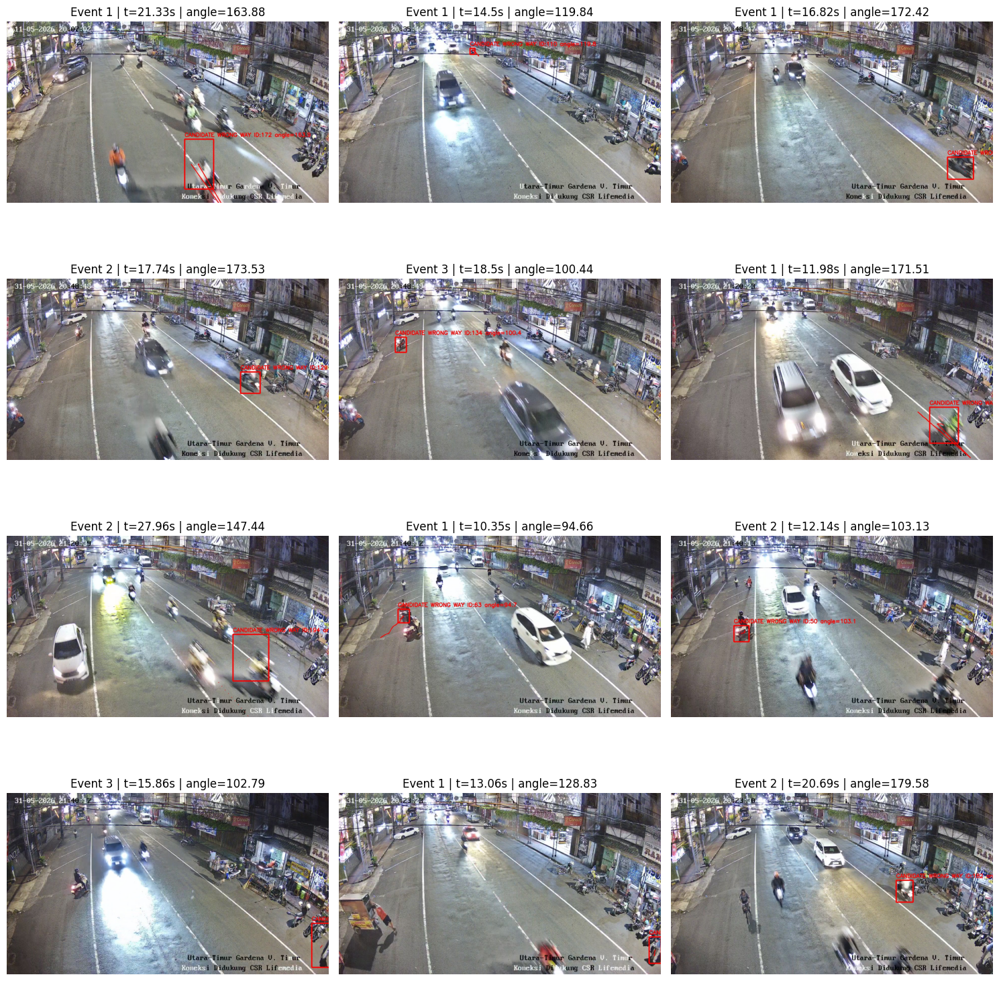

,global_event_id,batch_video_index,event_id,video_path,video_name,method,track_id,frame_idx,time_sec,lane_id,label,angle_diff,wrong_way_frames,net_displacement_px,dominant_direction_angle,evidence_path,manual_label,catatan
0,1,1,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,CCTV_Gardena_Malam_LawanArus.mp4,deepsort_mbcdd,172,534,21.33,1,motorcycle,163.88,4,500.09,46.23,/content/output_violations/CCTV_Gardena_Malam_...,UNREVIEWED,
1,2,3,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output113.mp4,deepsort_mbcdd,110,363,14.50,1,motorcycle,119.84,12,30.02,41.72,/content/output_violations/output113/deepsort_...,UNREVIEWED,
2,3,4,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,123,421,16.82,1,motorcycle,172.42,4,48.41,45.87,/content/output_violations/output152/deepsort_...,UNREVIEWED,
3,4,4,2,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,129,444,17.74,1,motorcycle,173.53,4,36.24,45.87,/content/output_violations/output152/deepsort_...,UNREVIEWED,
4,5,4,3,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,134,463,18.50,1,motorcycle,100.44,4,14.42,45.87,/content/output_violations/output152/deepsort_...,UNREVIEWED,


In [ ]:
def run_main_batch(video_paths: List[str], cfg: Config) -> Dict[str, Any]:
    all_events = []
    all_summaries = []
    all_logs = []
    all_tracks = []
    results = []

    for video_idx, video_path in enumerate(video_paths, start=1):
        print(f"\n=== Video {video_idx}/{len(video_paths)}: {Path(video_path).name} ===")
        processor = TrafficViolationProcessor(cfg, tracker_type="deepsort", method_name="deepsort_mbcdd")
        result = processor.run(video_path, max_seconds=None, display_every=0)
        results.append(result)

        events = result["events"].copy()
        if not events.empty:
            events.insert(0, "batch_video_index", video_idx)
            all_events.append(events)

        logs = result["logs"].copy()
        logs.insert(0, "video_name", Path(video_path).name)
        logs.insert(0, "video_path", video_path)
        all_logs.append(logs)

        tracks = result["tracks"].copy()
        tracks.insert(0, "video_name", Path(video_path).name)
        tracks.insert(0, "video_path", video_path)
        all_tracks.append(tracks)

        all_summaries.append(result["summary"])

    summary_df = pd.DataFrame(all_summaries)
    events_df = pd.concat(all_events, ignore_index=True) if all_events else pd.DataFrame(columns=[
        "batch_video_index", "event_id", "video_path", "video_name", "method", "track_id", "frame_idx", "time_sec",
        "lane_id", "label", "angle_diff", "wrong_way_frames", "net_displacement_px", "dominant_direction_angle",
        "evidence_path", "manual_label", "catatan"
    ])
    logs_df = pd.concat(all_logs, ignore_index=True) if all_logs else pd.DataFrame()
    tracks_df = pd.concat(all_tracks, ignore_index=True) if all_tracks else pd.DataFrame()

    if not events_df.empty:
        events_df["global_event_id"] = range(1, len(events_df) + 1)
        ordered_cols = ["global_event_id"] + [c for c in events_df.columns if c != "global_event_id"]
        events_df = events_df[ordered_cols]

    output_root = Path(cfg.output_dir)
    output_root.mkdir(parents=True, exist_ok=True)
    events_path = output_root / "candidate_events_all.csv"
    review_path = output_root / "review_queue.csv"
    summary_path = output_root / "run_summary_all.csv"
    logs_path = output_root / "frame_logs_all.csv"
    tracks_path = output_root / "tracks_summary_all.csv"

    events_df.to_csv(events_path, index=False)
    events_df.to_csv(review_path, index=False)
    summary_df.to_csv(summary_path, index=False)
    logs_df.to_csv(logs_path, index=False)
    tracks_df.to_csv(tracks_path, index=False)

    print("\nBatch utama selesai.")
    print(f"Candidate events : {events_path}")
    print(f"Review queue     : {review_path}")
    print(f"Run summary      : {summary_path}")
    display(summary_df)
    show_candidate_gallery(events_df, max_items=12)

    return {
        "results": results,
        "summary": summary_df,
        "events": events_df,
        "logs": logs_df,
        "tracks": tracks_df,
        "review_path": str(review_path),
        "events_path": str(events_path),
    }


main_batch_result = run_main_batch(MAIN_VIDEO_PATHS, CFG)
main_result = main_batch_result["results"][0] if main_batch_result["results"] else None
review_df = main_batch_result["events"].copy()
display(review_df.head())

## 9. Manual Review Kandidat Pelanggaran dan Simpan CSV

,manual_label,jumlah
0,UNREVIEWED,42


,global_event_id,batch_video_index,event_id,video_path,video_name,method,track_id,frame_idx,time_sec,lane_id,label,angle_diff,wrong_way_frames,net_displacement_px,dominant_direction_angle,evidence_path,manual_label,catatan
0,1,1,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,CCTV_Gardena_Malam_LawanArus.mp4,deepsort_mbcdd,172,534,21.33,1,motorcycle,163.88,4,500.09,46.23,/content/output_violations/CCTV_Gardena_Malam_...,UNREVIEWED,NaN
1,2,3,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output113.mp4,deepsort_mbcdd,110,363,14.50,1,motorcycle,119.84,12,30.02,41.72,/content/output_violations/output113/deepsort_...,UNREVIEWED,NaN
2,3,4,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,123,421,16.82,1,motorcycle,172.42,4,48.41,45.87,/content/output_violations/output152/deepsort_...,UNREVIEWED,NaN
3,4,4,2,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,129,444,17.74,1,motorcycle,173.53,4,36.24,45.87,/content/output_violations/output152/deepsort_...,UNREVIEWED,NaN
4,5,4,3,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output152.mp4,deepsort_mbcdd,134,463,18.50,1,motorcycle,100.44,4,14.42,45.87,/content/output_violations/output152/deepsort_...,UNREVIEWED,NaN
5,6,6,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output192.mp4,deepsort_mbcdd,54,300,11.98,1,motorcycle,171.51,4,688.43,49.56,/content/output_violations/output192/deepsort_...,UNREVIEWED,NaN
6,7,6,2,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output192.mp4,deepsort_mbcdd,194,700,27.96,1,motorcycle,147.44,4,161.82,49.56,/content/output_violations/output192/deepsort_...,UNREVIEWED,NaN
7,8,8,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output230.mp4,deepsort_mbcdd,63,259,10.35,1,motorcycle,94.66,4,211.30,45.26,/content/output_violations/output230/deepsort_...,UNREVIEWED,NaN
8,9,8,2,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output230.mp4,deepsort_mbcdd,50,304,12.14,1,motorcycle,103.13,4,17.69,45.26,/content/output_violations/output230/deepsort_...,UNREVIEWED,NaN
9,10,8,3,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output230.mp4,deepsort_mbcdd,116,397,15.86,1,motorcycle,102.79,9,13.04,45.26,/content/output_violations/output230/deepsort_...,UNREVIEWED,NaN


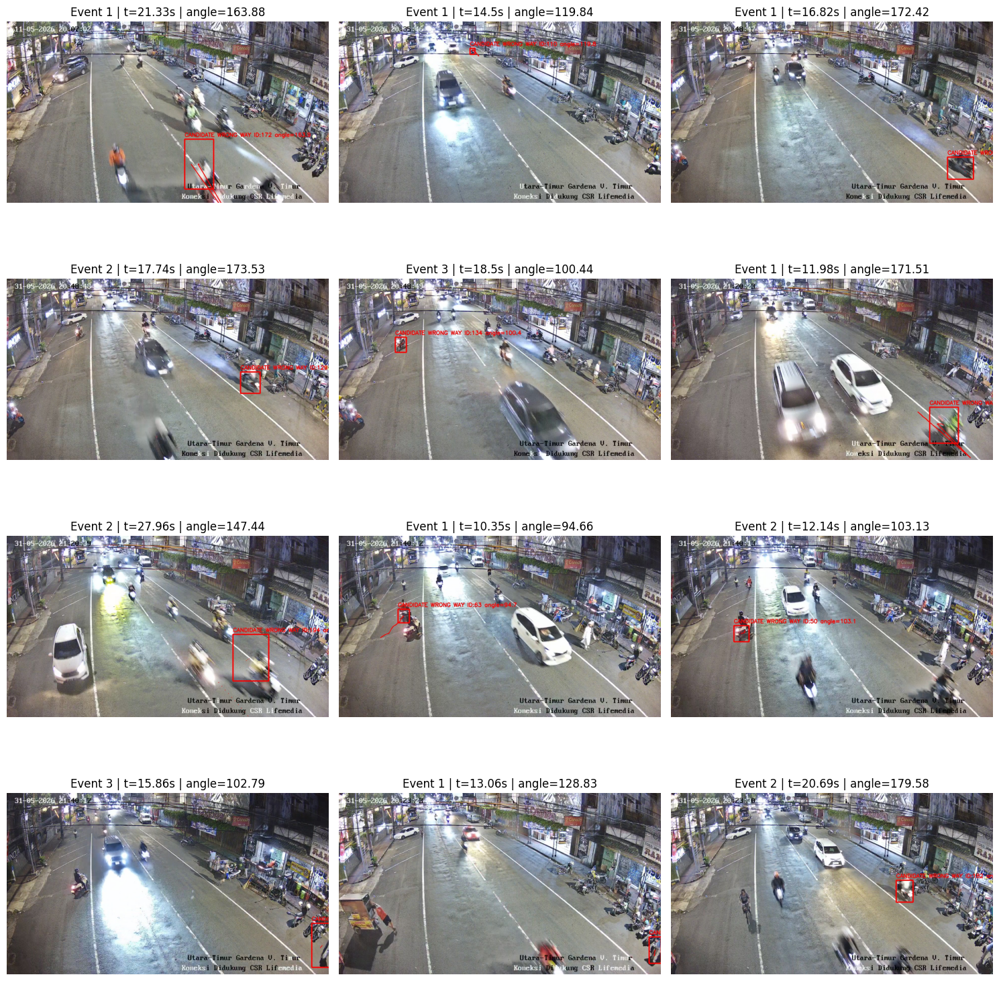

Contoh review:
event_id = show_next_unreviewed(review_df)
review_df = set_review_label(review_df, event_id, 'TP', 'Benar motor melawan arus')
review_df = set_review_label(review_df, event_id, 'FP', 'Bukan pelanggaran')


In [ ]:
REVIEW_PATH = Path(CFG.output_dir) / "review_queue.csv"
REVIEWED_PATH = Path(CFG.output_dir) / "review_queue_reviewed.csv"


def load_review_csv(path: Path = REVIEW_PATH) -> pd.DataFrame:
    if path.exists():
        return pd.read_csv(path)
    print(f"Review CSV belum ada: {path}")
    return review_df.copy() if "review_df" in globals() else pd.DataFrame()


def save_review_csv(review_df: pd.DataFrame, path: Path = REVIEWED_PATH) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)
    review_df.to_csv(path, index=False)
    review_df.to_csv(REVIEW_PATH, index=False)
    print(f"Review tersimpan: {path}")


def show_review_item(review_df: pd.DataFrame, event_id: int) -> None:
    id_col = "global_event_id" if "global_event_id" in review_df.columns else "event_id"
    row = review_df.loc[review_df[id_col] == event_id]
    if row.empty:
        print(f"event_id {event_id} tidak ditemukan pada kolom {id_col}")
        return
    item = row.iloc[0].to_dict()
    display(pd.DataFrame([item]))
    path = item.get("evidence_path")
    if isinstance(path, str) and Path(path).exists():
        img = cv2.imread(path)
        show_bgr(img, f"Review Event {event_id}")
    else:
        print("Evidence image tidak ditemukan.")


def show_next_unreviewed(review_df: pd.DataFrame) -> Optional[int]:
    id_col = "global_event_id" if "global_event_id" in review_df.columns else "event_id"
    pending = review_df[review_df["manual_label"].fillna("UNREVIEWED") == "UNREVIEWED"]
    if pending.empty:
        print("Semua kandidat sudah direview.")
        return None
    event_id = int(pending.iloc[0][id_col])
    show_review_item(review_df, event_id)
    print(f"Gunakan: review_df = set_review_label(review_df, {event_id}, 'TP'/'FP'/'IGNORE', 'catatan')")
    return event_id


def set_review_label(review_df: pd.DataFrame, event_id: int, label: str, catatan: str = "", save: bool = True) -> pd.DataFrame:
    valid_labels = {"TP", "FP", "IGNORE", "UNREVIEWED"}
    label = label.upper()
    if label not in valid_labels:
        raise ValueError(f"Label harus salah satu dari {valid_labels}")
    review_df = review_df.copy()
    id_col = "global_event_id" if "global_event_id" in review_df.columns else "event_id"
    mask = review_df[id_col] == event_id
    if not mask.any():
        raise ValueError(f"Event {event_id} tidak ditemukan")
    review_df.loc[mask, "manual_label"] = label
    review_df.loc[mask, "catatan"] = catatan
    if save:
        save_review_csv(review_df)
    return review_df


def add_missed_violation(review_df: pd.DataFrame, video_path: str, time_sec: float, lane_id: int = -1, catatan: str = "") -> pd.DataFrame:
    review_df = review_df.copy()
    id_col = "global_event_id" if "global_event_id" in review_df.columns else "event_id"
    next_id = int(review_df[id_col].max() + 1) if len(review_df) and pd.notna(review_df[id_col].max()) else 1
    row = {col: None for col in review_df.columns}
    row.update({
        id_col: next_id,
        "video_path": video_path,
        "video_name": Path(video_path).name,
        "method": "manual_fn",
        "time_sec": time_sec,
        "lane_id": lane_id,
        "label": "manual_missed_violation",
        "manual_label": "FN",
        "catatan": catatan,
    })
    review_df = pd.concat([review_df, pd.DataFrame([row])], ignore_index=True)
    save_review_csv(review_df)
    return review_df


def review_progress(review_df: pd.DataFrame) -> pd.DataFrame:
    if review_df.empty:
        return pd.DataFrame([{"status": "Tidak ada kandidat", "jumlah": 0}])
    return review_df["manual_label"].fillna("UNREVIEWED").value_counts().rename_axis("manual_label").reset_index(name="jumlah")


review_df = load_review_csv()
display(review_progress(review_df))
display(review_df)
show_candidate_gallery(review_df, max_items=12)

print("Contoh review:")
print("event_id = show_next_unreviewed(review_df)")
print("review_df = set_review_label(review_df, event_id, 'TP', 'Benar motor melawan arus')")
print("review_df = set_review_label(review_df, event_id, 'FP', 'Bukan pelanggaran')")

# 9.1 Loop Manual Review

In [ ]:
# Run ini jika ingin reset hasil review

review_df['manual_label'] = 'UNREVIEWED'
review_df['catatan'] = ''

save_review_csv(review_df)
print("Review data has been reset to UNREVIEWED.")
display(review_progress(review_df))

Review tersimpan: /content/output_violations/review_queue_reviewed.csv
Review data has been reset to UNREVIEWED.


,manual_label,jumlah
0,UNREVIEWED,42


In [ ]:
# 1. Menampilkan review setelahnya

event_id = show_next_unreviewed(review_df)

Semua kandidat sudah direview.


In [ ]:
# 2. Nilai event tersebut

review_df = set_review_label(review_df, event_id, 'FP', 'Motor tidak melawan arus')

Review tersimpan: /content/output_violations/review_queue_reviewed.csv


## 10. Evaluasi Kuantitatif

In [ ]:
def compute_quantitative_metrics(review_df: pd.DataFrame, logs_df: Optional[pd.DataFrame] = None) -> Dict[str, Any]:
    labels = review_df["manual_label"].fillna("UNREVIEWED") if len(review_df) else pd.Series(dtype=str)
    tp = int((labels == "TP").sum())
    fp = int((labels == "FP").sum())
    fn = int((labels == "FN").sum())
    ignored = int((labels == "IGNORE").sum())
    unreviewed = int((labels == "UNREVIEWED").sum())

    precision = tp / (tp + fp) if (tp + fp) else 0.0
    recall = tp / (tp + fn) if (tp + fn) else 0.0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) else 0.0
    fnr = fn / (tp + fn) if (tp + fn) else 0.0
    fpr_proxy = fp / (tp + fp) if (tp + fp) else 0.0

    metrics = {
        "TP": tp,
        "FP": fp,
        "FN": fn,
        "Ignored": ignored,
        "Unreviewed": unreviewed,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1,
        "FNR": fnr,
        "FPR_proxy": fpr_proxy,
    }
    if logs_df is not None and len(logs_df):
        metrics.update({
            "Avg FPS": float(logs_df["runtime_fps"].mean()),
            "Avg Latency (ms)": float(logs_df["runtime_sec"].mean() * 1000),
            "Processed Frames": int(len(logs_df)),
        })
    return metrics


review_df = load_review_csv()
logs_for_eval = main_batch_result["logs"] if "main_batch_result" in globals() else None
quant_metrics = compute_quantitative_metrics(review_df, logs_for_eval)
quant_df = pd.DataFrame([quant_metrics])
quant_path = Path(CFG.output_dir) / "quantitative_metrics.csv"
quant_df.to_csv(quant_path, index=False)
display(quant_df)
print(f"Metrik kuantitatif tersimpan: {quant_path}")

display(Markdown("""
### Interpretasi Kuantitatif untuk Laporan

- **Precision**: proporsi kandidat pelanggaran yang benar setelah manual review.
- **Recall**: proporsi pelanggaran nyata yang berhasil ditemukan, termasuk FN manual jika ada.
- **F1-score**: keseimbangan Precision dan Recall.
- **FPR_proxy**: proporsi kandidat sistem yang ternyata false positive; digunakan karena ground truth semua kendaraan legal tidak dianotasi penuh.
- **FPS** dan **latency**: kelayakan komputasi untuk real-time/semi-real-time.
"""))

,TP,FP,FN,Ignored,Unreviewed,Precision,Recall,F1-score,FNR,FPR_proxy,Avg FPS,Avg Latency (ms),Processed Frames
0,6,13,0,23,0,0.315789,1.0,0.48,0.0,0.684211,16.348483,81.517396,29788


Metrik kuantitatif tersimpan: /content/output_violations/quantitative_metrics.csv



### Interpretasi Kuantitatif untuk Laporan

- **Precision**: proporsi kandidat pelanggaran yang benar setelah manual review.
- **Recall**: proporsi pelanggaran nyata yang berhasil ditemukan, termasuk FN manual jika ada.
- **F1-score**: keseimbangan Precision dan Recall.
- **FPR_proxy**: proporsi kandidat sistem yang ternyata false positive; digunakan karena ground truth semua kendaraan legal tidak dianotasi penuh.
- **FPS** dan **latency**: kelayakan komputasi untuk real-time/semi-real-time.


## 11. Analisis Kualitatif

Contoh TP


,global_event_id,batch_video_index,event_id,video_path,video_name,method,track_id,frame_idx,time_sec,lane_id,label,angle_diff,wrong_way_frames,net_displacement_px,dominant_direction_angle,evidence_path,manual_label,catatan
0,1,1,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,CCTV_Gardena_Malam_LawanArus.mp4,deepsort_mbcdd,172,534,21.33,1,motorcycle,163.88,4,500.09,46.23,/content/output_violations/CCTV_Gardena_Malam_...,FP,Tidak mendeteksi apapun


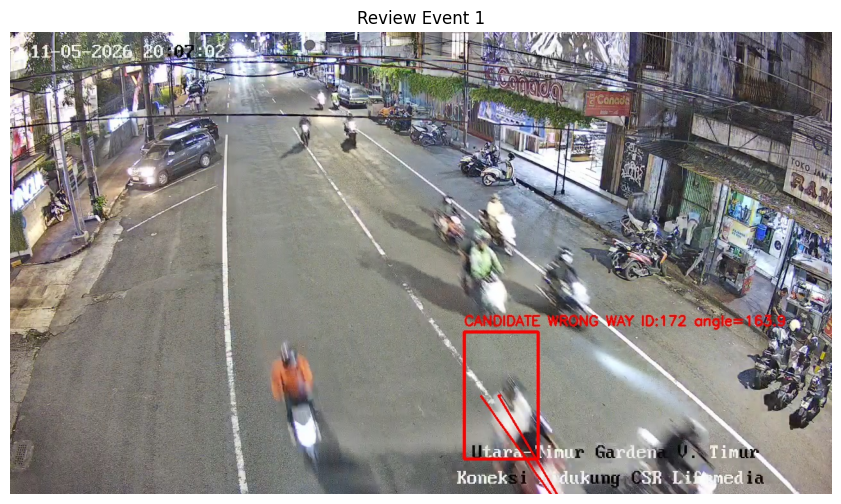

Contoh FP


,global_event_id,batch_video_index,event_id,video_path,video_name,method,track_id,frame_idx,time_sec,lane_id,label,angle_diff,wrong_way_frames,net_displacement_px,dominant_direction_angle,evidence_path,manual_label,catatan
0,1,1,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,CCTV_Gardena_Malam_LawanArus.mp4,deepsort_mbcdd,172,534,21.33,1,motorcycle,163.88,4,500.09,46.23,/content/output_violations/CCTV_Gardena_Malam_...,FP,Tidak mendeteksi apapun


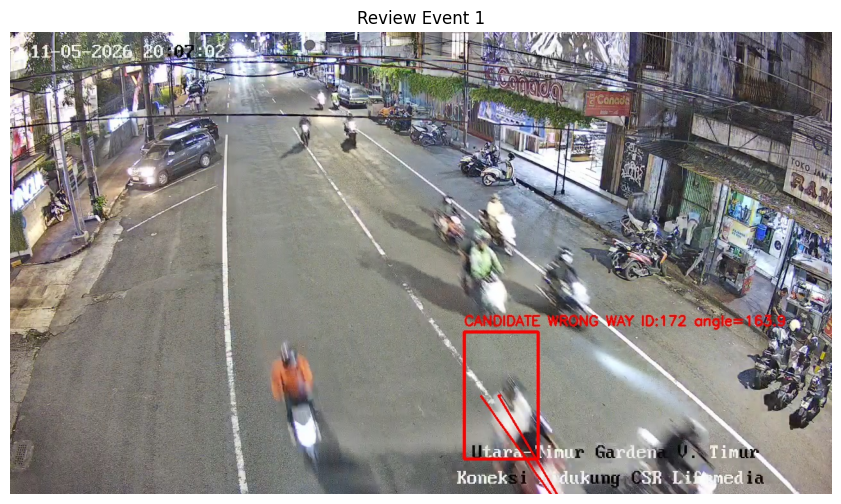

Tidak ada contoh FN
Contoh IGNORE


,global_event_id,batch_video_index,event_id,video_path,video_name,method,track_id,frame_idx,time_sec,lane_id,label,angle_diff,wrong_way_frames,net_displacement_px,dominant_direction_angle,evidence_path,manual_label,catatan
0,2,3,1,/content/drive/MyDrive/PKAC/dataset_proyek/law...,output113.mp4,deepsort_mbcdd,110,363,14.5,1,motorcycle,119.84,12,30.02,41.72,/content/output_violations/output113/deepsort_...,TP,Motor melawan arus


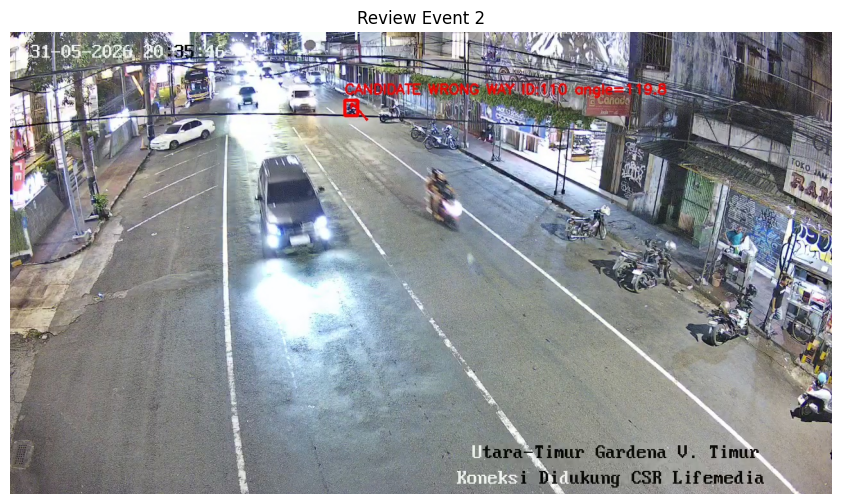


### Template Analisis Kualitatif untuk Laporan

Tuliskan temuan berdasarkan hasil review manual:

| Kondisi | Temuan | Dampak | Contoh |
|---|---|---|---|
| Oklusi kendaraan | ... | ID switching / arah salah | Event ... |
| Malam hari | ... | confidence turun / motion blur | Event ... |
| Sepeda motor kecil | ... | bounding box tidak stabil | Event ... |
| ROI terlalu sempit/lebar | ... | FP/FN di batas jalan | Event ... |
| Kendaraan lambat/berhenti | ... | vektor arah tidak cukup kuat | Event ... |


In [ ]:
def show_examples_by_label(review_df: pd.DataFrame, labels: List[str] = ["TP", "FP", "FN", "IGNORE"]) -> None:
    for label in labels:
        subset = review_df[review_df["manual_label"] == label]
        if subset.empty:
            print(f"Tidak ada contoh {label}")
            continue
        print(f"Contoh {label}")
        event_id = int(subset.iloc[0]["event_id"])
        show_review_item(review_df, event_id)


show_examples_by_label(review_df)

## 12. Method Comparison

In [ ]:
def run_method_comparison(video_paths: List[str], max_videos: int = 2) -> pd.DataFrame:
    comparison_videos = video_paths[:max_videos]
    methods = {
        "YOLOv8 + DeepSORT + MBCDD": {"tracker_type": "deepsort", "fixed_direction": None, "method_name": "compare_deepsort_mbcdd"},
        "YOLOv8 + Centroid + MBCDD": {"tracker_type": "centroid", "fixed_direction": None, "method_name": "compare_centroid_mbcdd"},
        "YOLOv8 + DeepSORT + Fixed Direction": {"tracker_type": "deepsort", "fixed_direction": {1: (1.0, 1.0)}, "method_name": "compare_deepsort_fixed"},
    }
    rows = []
    for method_name, kwargs in methods.items():
        for video_path in comparison_videos:
            print(f"\n=== {method_name} | {Path(video_path).name} ===")
            proc = TrafficViolationProcessor(CFG, tracker_type=kwargs["tracker_type"], fixed_direction=kwargs["fixed_direction"], method_name=kwargs["method_name"])
            result = proc.run(video_path, max_seconds=None, display_every=0)
            row = result["summary"].copy()
            row["comparison_name"] = method_name
            rows.append(row)
    comparison_df = pd.DataFrame(rows)
    comparison_summary = (
        comparison_df.groupby("comparison_name")
        .agg(
            videos=("video_name", "count"),
            total_candidate_events=("candidate_events", "sum"),
            avg_candidate_events=("candidate_events", "mean"),
            avg_tracks=("total_tracks", "mean"),
            avg_fps=("avg_runtime_fps", "mean"),
            avg_latency_ms=("avg_latency_ms", "mean"),
        )
        .reset_index()
    )
    path = Path(CFG.output_dir) / "method_comparison_summary.csv"
    comparison_summary.to_csv(path, index=False)
    print(f"Method comparison tersimpan: {path}")
    return comparison_summary


method_comparison_df = run_method_comparison(MAIN_VIDEO_PATHS, max_videos=10)
display(method_comparison_df)

display(Markdown("""
### Catatan Method Comparison untuk Laporan

Perbandingan ini tidak menggantikan evaluasi manual utama. Tujuannya adalah menunjukkan trade-off metode:

| Metode | Peran di laporan |
|---|---|
| YOLOv8 + DeepSORT + MBCDD | Metode utama sesuai proposal |
| YOLOv8 + Centroid + MBCDD | Baseline tracking sederhana, biasanya lebih rentan ID switching |
| YOLOv8 + DeepSORT + Fixed Direction | Baseline arah hardcoded, lebih sederhana tetapi kurang sesuai metodologi adaptif |
"""))


=== YOLOv8 + DeepSORT + MBCDD | CCTV_Gardena_Malam_LawanArus.mp4 ===
Mulai analisis: CCTV_Gardena_Malam_LawanArus.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_Malam_LawanArus.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=4 tracks=0 events=0 fps=3.43
frame=100 time=4.0s phase=validation det=9 tracks=16 events=0 fps=8.84
frame=200 time=8.0s phase=validation det=10 tracks=18 events=0 fps=10.96
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.2, dx=397.94, dy=415.45, n_tracks=31
frame=300 time=12.0s phase=monitoring det=8 tracks=12 events=0 fps=12.57
frame=400 time=16.0s phase=monitoring det=10 tracks=11 events=0 fps=11.68
frame=500 time=20.0s phase=monitoring det=8 tracks=12 events=0 fps=6.45
frame=600 time=24.0s phase=monitoring det=7 tracks=7 events=1 fps=12.32
frame=700 time=28.0s phase=monitoring det=9 tracks=8 events=1 fps=10.70
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output100.mp4 ===
Mulai analisis: output100.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output100.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=0 events=0 fps=2.48
frame=100 time=4.0s phase=validation det=11 tracks=15 events=0 fps=13.43
frame=200 time=8.0s phase=validation det=7 tracks=17 events=0 fps=11.51
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.1, dx=484.54, dy=503.69, n_tracks=26
frame=300 time=12.0s phase=monitoring det=12 tracks=11 events=0 fps=12.99
frame=400 time=16.0s phase=monitoring det=12 tracks=20 events=0 fps=5.33
frame=500 time=20.0s phase=monitoring det=8 tracks=11 events=0 fps=7.84
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=0 fps=12.38
frame=700 time=28.0s phase=monitoring det=11 tracks=13 events=0 fps=9.59
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output113.mp4 ===
Mulai analisis: output113.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output113.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=0 events=0 fps=3.26
frame=100 time=4.0s phase=validation det=9 tracks=13 events=0 fps=8.34
frame=200 time=8.0s phase=validation det=8 tracks=11 events=0 fps=12.94
Arah dominan hasil MBCDD:
  Lajur 1: angle=41.7, dx=333.32, dy=297.23, n_tracks=22
frame=300 time=12.0s phase=monitoring det=7 tracks=11 events=0 fps=14.09
frame=400 time=16.0s phase=monitoring det=9 tracks=11 events=1 fps=11.81
frame=500 time=20.0s phase=monitoring det=9 tracks=14 events=1 fps=6.52
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=1 fps=11.85
frame=700 time=28.0s phase=monitoring det=9 tracks=12 events=1 fps=11.06
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output152.mp4 ===
Mulai analisis: output152.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output152.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=0 events=0 fps=2.38
frame=100 time=4.0s phase=validation det=7 tracks=11 events=0 fps=15.48
frame=200 time=8.0s phase=validation det=5 tracks=8 events=0 fps=16.54
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.9, dx=501.22, dy=516.61, n_tracks=18
frame=300 time=12.0s phase=monitoring det=9 tracks=14 events=0 fps=6.81
frame=400 time=16.0s phase=monitoring det=5 tracks=7 events=0 fps=6.76
frame=500 time=20.0s phase=monitoring det=12 tracks=14 events=3 fps=8.00
frame=600 time=24.0s phase=monitoring det=9 tracks=11 events=3 fps=11.16
frame=700 time=28.0s phase=monitoring det=9 tracks=12 events=3 fps=9.99
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output188.mp4 ===
Mulai analisis: output188.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output188.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=3.22
frame=100 time=4.0s phase=validation det=8 tracks=12 events=0 fps=14.61
frame=200 time=8.0s phase=validation det=6 tracks=14 events=0 fps=10.23
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.0, dx=300.17, dy=345.54, n_tracks=24
frame=300 time=12.0s phase=monitoring det=9 tracks=8 events=0 fps=13.61
frame=400 time=16.0s phase=monitoring det=7 tracks=8 events=0 fps=12.54
frame=500 time=20.0s phase=monitoring det=9 tracks=15 events=0 fps=10.02
frame=600 time=24.0s phase=monitoring det=8 tracks=9 events=0 fps=10.20
frame=700 time=28.0s phase=monitoring det=7 tracks=12 events=0 fps=10.08
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output192.mp4 ===
Mulai analisis: output192.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output192.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=0 events=0 fps=3.24
frame=100 time=4.0s phase=validation det=7 tracks=5 events=0 fps=18.44
frame=200 time=8.0s phase=validation det=9 tracks=11 events=0 fps=11.02
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.6, dx=243.29, dy=285.50, n_tracks=14
frame=300 time=12.0s phase=monitoring det=8 tracks=14 events=1 fps=9.06
frame=400 time=16.0s phase=monitoring det=8 tracks=13 events=1 fps=10.79
frame=500 time=20.0s phase=monitoring det=6 tracks=14 events=1 fps=10.84
frame=600 time=24.0s phase=monitoring det=8 tracks=9 events=1 fps=10.56
frame=700 time=28.0s phase=monitoring det=8 tracks=16 events=2 fps=8.76
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output200.mp4 ===
Mulai analisis: output200.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output200.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=2.59
frame=100 time=4.0s phase=validation det=6 tracks=9 events=0 fps=16.10
frame=200 time=8.0s phase=validation det=6 tracks=9 events=0 fps=14.18
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.4, dx=432.78, dy=454.22, n_tracks=18
frame=300 time=12.0s phase=monitoring det=5 tracks=8 events=0 fps=13.67
frame=400 time=16.0s phase=monitoring det=6 tracks=15 events=0 fps=13.36
frame=500 time=20.0s phase=monitoring det=5 tracks=11 events=0 fps=11.97
frame=600 time=24.0s phase=monitoring det=6 tracks=7 events=0 fps=13.09
frame=700 time=28.0s phase=monitoring det=5 tracks=11 events=0 fps=6.77
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output230.mp4 ===
Mulai analisis: output230.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output230.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.30
frame=100 time=4.0s phase=validation det=6 tracks=10 events=0 fps=8.88
frame=200 time=8.0s phase=validation det=10 tracks=13 events=0 fps=12.70
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.3, dx=369.44, dy=372.81, n_tracks=16
frame=300 time=12.0s phase=monitoring det=7 tracks=11 events=1 fps=12.61
frame=400 time=16.0s phase=monitoring det=6 tracks=10 events=3 fps=13.19
frame=500 time=20.0s phase=monitoring det=4 tracks=6 events=3 fps=9.85
frame=600 time=24.0s phase=monitoring det=6 tracks=5 events=3 fps=12.42
frame=700 time=28.0s phase=monitoring det=3 tracks=6 events=3 fps=11.95
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output86.mp4 ===
Mulai analisis: output86.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output86.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=0 events=0 fps=2.37
frame=100 time=4.0s phase=validation det=8 tracks=20 events=0 fps=10.85
frame=200 time=8.0s phase=validation det=10 tracks=14 events=0 fps=11.98
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.6, dx=352.79, dy=372.97, n_tracks=34
frame=300 time=12.0s phase=monitoring det=9 tracks=12 events=0 fps=10.72
frame=400 time=16.0s phase=monitoring det=8 tracks=11 events=1 fps=12.02
frame=500 time=20.0s phase=monitoring det=8 tracks=8 events=1 fps=8.43
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=2 fps=11.64
frame=700 time=28.0s phase=monitoring det=6 tracks=8 events=2 fps=11.97
Analisis selesai

=== YOLOv8 + DeepSORT + MBCDD | output87.mp4 ===
Mulai analisis: output87.mp4 | method=compare_deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output87.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=0 events=0 fps=2.36
frame=100 time=4.0s phase=validation det=8 tracks=13 events=0 fps=14.12
frame=200 time=8.0s phase=validation det=6 tracks=8 events=0 fps=10.80
Arah dominan hasil MBCDD:
  Lajur 1: angle=48.5, dx=311.41, dy=352.41, n_tracks=17
frame=300 time=12.0s phase=monitoring det=9 tracks=17 events=0 fps=11.48
frame=400 time=16.0s phase=monitoring det=9 tracks=9 events=0 fps=6.64
frame=500 time=20.0s phase=monitoring det=6 tracks=10 events=0 fps=12.02
frame=600 time=24.0s phase=monitoring det=6 tracks=13 events=0 fps=10.44
frame=700 time=28.0s phase=monitoring det=6 tracks=16 events=0 fps=13.89
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | CCTV_Gardena_Malam_LawanArus.mp4 ===
Mulai analisis: CCTV_Gardena_Malam_LawanArus.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_Malam_LawanArus.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=4 tracks=4 events=0 fps=3.25
frame=100 time=4.0s phase=validation det=9 tracks=9 events=0 fps=53.93
frame=200 time=8.0s phase=validation det=10 tracks=10 events=0 fps=44.63
Arah dominan hasil MBCDD:
  Lajur 1: angle=49.6, dx=196.25, dy=230.54, n_tracks=28
frame=300 time=12.0s phase=monitoring det=8 tracks=8 events=0 fps=44.80
frame=400 time=16.0s phase=monitoring det=10 tracks=10 events=0 fps=54.14
frame=500 time=20.0s phase=monitoring det=8 tracks=8 events=0 fps=45.07
frame=600 time=24.0s phase=monitoring det=7 tracks=7 events=1 fps=60.47
frame=700 time=28.0s phase=monitoring det=9 tracks=9 events=1 fps=37.39
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output100.mp4 ===
Mulai analisis: output100.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output100.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=8 events=0 fps=3.45
frame=100 time=4.0s phase=validation det=11 tracks=11 events=0 fps=47.58
frame=200 time=8.0s phase=validation det=7 tracks=7 events=0 fps=49.24
Arah dominan hasil MBCDD:
  Lajur 1: angle=46.6, dx=276.62, dy=293.00, n_tracks=26
frame=300 time=12.0s phase=monitoring det=12 tracks=12 events=1 fps=33.83
frame=400 time=16.0s phase=monitoring det=12 tracks=12 events=1 fps=46.18
frame=500 time=20.0s phase=monitoring det=8 tracks=8 events=1 fps=49.49
frame=600 time=24.0s phase=monitoring det=8 tracks=8 events=1 fps=54.52
frame=700 time=28.0s phase=monitoring det=11 tracks=11 events=3 fps=32.08
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output113.mp4 ===
Mulai analisis: output113.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output113.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=10 events=0 fps=3.69
frame=100 time=4.0s phase=validation det=9 tracks=9 events=0 fps=55.14
frame=200 time=8.0s phase=validation det=8 tracks=8 events=0 fps=46.75
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.6, dx=271.71, dy=277.07, n_tracks=14
frame=300 time=12.0s phase=monitoring det=7 tracks=7 events=1 fps=40.97
frame=400 time=16.0s phase=monitoring det=9 tracks=9 events=2 fps=42.09
frame=500 time=20.0s phase=monitoring det=9 tracks=9 events=2 fps=51.07
frame=600 time=24.0s phase=monitoring det=8 tracks=8 events=2 fps=49.79
frame=700 time=28.0s phase=monitoring det=9 tracks=9 events=2 fps=35.96
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output152.mp4 ===
Mulai analisis: output152.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output152.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=6 events=0 fps=4.00
frame=100 time=4.0s phase=validation det=7 tracks=7 events=0 fps=55.80
frame=200 time=8.0s phase=validation det=5 tracks=5 events=0 fps=51.00
Arah dominan hasil MBCDD:
  Lajur 1: angle=48.7, dx=262.75, dy=299.06, n_tracks=16
frame=300 time=12.0s phase=monitoring det=9 tracks=9 events=0 fps=45.44
frame=400 time=16.0s phase=monitoring det=5 tracks=5 events=0 fps=49.84
frame=500 time=20.0s phase=monitoring det=12 tracks=12 events=3 fps=49.93
frame=600 time=24.0s phase=monitoring det=9 tracks=9 events=3 fps=55.45
frame=700 time=28.0s phase=monitoring det=9 tracks=9 events=3 fps=41.47
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output188.mp4 ===
Mulai analisis: output188.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output188.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=9 events=0 fps=3.62
frame=100 time=4.0s phase=validation det=8 tracks=8 events=0 fps=52.48
frame=200 time=8.0s phase=validation det=6 tracks=6 events=0 fps=48.95
Arah dominan hasil MBCDD:
  Lajur 1: angle=52.0, dx=129.56, dy=166.11, n_tracks=18
frame=300 time=12.0s phase=monitoring det=9 tracks=9 events=0 fps=49.91
frame=400 time=16.0s phase=monitoring det=7 tracks=7 events=0 fps=53.99
frame=500 time=20.0s phase=monitoring det=9 tracks=9 events=0 fps=51.13
frame=600 time=24.0s phase=monitoring det=8 tracks=8 events=0 fps=52.29
frame=700 time=28.0s phase=monitoring det=7 tracks=7 events=0 fps=41.11
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output192.mp4 ===
Mulai analisis: output192.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output192.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=6 events=0 fps=3.79
frame=100 time=4.0s phase=validation det=7 tracks=7 events=0 fps=56.33
frame=200 time=8.0s phase=validation det=9 tracks=9 events=0 fps=51.28
Arah dominan hasil MBCDD:
  Lajur 1: angle=54.9, dx=129.17, dy=183.75, n_tracks=12
frame=300 time=12.0s phase=monitoring det=8 tracks=8 events=0 fps=38.11
frame=400 time=16.0s phase=monitoring det=8 tracks=8 events=0 fps=50.91
frame=500 time=20.0s phase=monitoring det=6 tracks=6 events=0 fps=48.22
frame=600 time=24.0s phase=monitoring det=8 tracks=8 events=0 fps=53.58
frame=700 time=28.0s phase=monitoring det=8 tracks=8 events=1 fps=41.77
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output200.mp4 ===
Mulai analisis: output200.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output200.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=9 events=0 fps=3.46
frame=100 time=4.0s phase=validation det=6 tracks=6 events=0 fps=54.80
frame=200 time=8.0s phase=validation det=6 tracks=6 events=0 fps=47.78
Arah dominan hasil MBCDD:
  Lajur 1: angle=47.3, dx=231.47, dy=250.87, n_tracks=15
frame=300 time=12.0s phase=monitoring det=5 tracks=5 events=0 fps=36.00
frame=400 time=16.0s phase=monitoring det=6 tracks=6 events=0 fps=49.58
frame=500 time=20.0s phase=monitoring det=5 tracks=5 events=0 fps=53.90
frame=600 time=24.0s phase=monitoring det=6 tracks=6 events=0 fps=51.00
frame=700 time=28.0s phase=monitoring det=5 tracks=5 events=0 fps=40.70
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output230.mp4 ===
Mulai analisis: output230.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output230.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=3 events=0 fps=3.65
frame=100 time=4.0s phase=validation det=6 tracks=6 events=0 fps=51.69
frame=200 time=8.0s phase=validation det=10 tracks=10 events=0 fps=51.87
Arah dominan hasil MBCDD:
  Lajur 1: angle=44.7, dx=197.41, dy=195.59, n_tracks=17
frame=300 time=12.0s phase=monitoring det=7 tracks=7 events=1 fps=48.20
frame=400 time=16.0s phase=monitoring det=6 tracks=6 events=1 fps=48.87
frame=500 time=20.0s phase=monitoring det=4 tracks=4 events=1 fps=49.56
frame=600 time=24.0s phase=monitoring det=6 tracks=6 events=2 fps=45.62
frame=700 time=28.0s phase=monitoring det=3 tracks=3 events=2 fps=52.28
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output86.mp4 ===
Mulai analisis: output86.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output86.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=10 events=0 fps=2.43
frame=100 time=4.0s phase=validation det=8 tracks=8 events=0 fps=48.34
frame=200 time=8.0s phase=validation det=10 tracks=10 events=0 fps=49.14
Arah dominan hasil MBCDD:
  Lajur 1: angle=51.3, dx=174.59, dy=217.97, n_tracks=29
frame=300 time=12.0s phase=monitoring det=9 tracks=9 events=0 fps=45.68
frame=400 time=16.0s phase=monitoring det=8 tracks=8 events=1 fps=49.49
frame=500 time=20.0s phase=monitoring det=8 tracks=8 events=1 fps=48.24
frame=600 time=24.0s phase=monitoring det=8 tracks=8 events=3 fps=49.60
frame=700 time=28.0s phase=monitoring det=6 tracks=6 events=4 fps=33.48
Analisis selesai

=== YOLOv8 + Centroid + MBCDD | output87.mp4 ===
Mulai analisis: output87.mp4 | method=compare_centroid_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output87.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=8 events=0 fps=2.70
frame=100 time=4.0s phase=validation det=8 tracks=8 events=0 fps=48.84
frame=200 time=8.0s phase=validation det=6 tracks=6 events=0 fps=57.50
Arah dominan hasil MBCDD:
  Lajur 1: angle=51.1, dx=158.00, dy=195.47, n_tracks=17
frame=300 time=12.0s phase=monitoring det=9 tracks=9 events=0 fps=46.51
frame=400 time=16.0s phase=monitoring det=9 tracks=9 events=0 fps=36.64
frame=500 time=20.0s phase=monitoring det=6 tracks=6 events=0 fps=53.45
frame=600 time=24.0s phase=monitoring det=6 tracks=6 events=0 fps=32.34
frame=700 time=28.0s phase=monitoring det=6 tracks=6 events=2 fps=49.04
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | CCTV_Gardena_Malam_LawanArus.mp4 ===
Mulai analisis: CCTV_Gardena_Malam_LawanArus.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing CCTV_Gardena_Malam_LawanArus.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=4 tracks=0 events=0 fps=2.67
frame=100 time=4.0s phase=validation det=9 tracks=16 events=0 fps=14.19
frame=200 time=8.0s phase=validation det=10 tracks=18 events=0 fps=11.80
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=8 tracks=12 events=0 fps=13.07
frame=400 time=16.0s phase=monitoring det=10 tracks=11 events=0 fps=7.26
frame=500 time=20.0s phase=monitoring det=8 tracks=12 events=0 fps=11.60
frame=600 time=24.0s phase=monitoring det=7 tracks=7 events=1 fps=12.37
frame=700 time=28.0s phase=monitoring det=9 tracks=8 events=1 fps=10.29
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output100.mp4 ===
Mulai analisis: output100.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output100.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=0 events=0 fps=3.32
frame=100 time=4.0s phase=validation det=11 tracks=15 events=0 fps=12.99
frame=200 time=8.0s phase=validation det=7 tracks=17 events=0 fps=11.23
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=12 tracks=11 events=0 fps=10.63
frame=400 time=16.0s phase=monitoring det=12 tracks=20 events=0 fps=9.76
frame=500 time=20.0s phase=monitoring det=8 tracks=11 events=0 fps=10.66
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=0 fps=12.60
frame=700 time=28.0s phase=monitoring det=11 tracks=13 events=0 fps=9.16
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output113.mp4 ===
Mulai analisis: output113.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output113.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=0 events=0 fps=2.50
frame=100 time=4.0s phase=validation det=9 tracks=13 events=0 fps=13.81
frame=200 time=8.0s phase=validation det=8 tracks=11 events=0 fps=12.76
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=7 tracks=11 events=0 fps=10.82
frame=400 time=16.0s phase=monitoring det=9 tracks=11 events=1 fps=11.49
frame=500 time=20.0s phase=monitoring det=9 tracks=14 events=1 fps=11.18
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=1 fps=11.78
frame=700 time=28.0s phase=monitoring det=9 tracks=12 events=1 fps=10.52
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output152.mp4 ===
Mulai analisis: output152.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output152.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=0 events=0 fps=3.39
frame=100 time=4.0s phase=validation det=7 tracks=11 events=0 fps=12.95
frame=200 time=8.0s phase=validation det=5 tracks=8 events=0 fps=9.75
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=9 tracks=14 events=0 fps=11.69
frame=400 time=16.0s phase=monitoring det=5 tracks=7 events=0 fps=12.77
frame=500 time=20.0s phase=monitoring det=12 tracks=14 events=3 fps=10.51
frame=600 time=24.0s phase=monitoring det=9 tracks=11 events=3 fps=11.65
frame=700 time=28.0s phase=monitoring det=9 tracks=12 events=3 fps=6.03
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output188.mp4 ===
Mulai analisis: output188.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output188.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=3.28
frame=100 time=4.0s phase=validation det=8 tracks=12 events=0 fps=9.39
frame=200 time=8.0s phase=validation det=6 tracks=14 events=0 fps=15.44
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=9 tracks=8 events=0 fps=12.29
frame=400 time=16.0s phase=monitoring det=7 tracks=8 events=0 fps=8.14
frame=500 time=20.0s phase=monitoring det=9 tracks=15 events=0 fps=5.97
frame=600 time=24.0s phase=monitoring det=8 tracks=9 events=0 fps=10.61
frame=700 time=28.0s phase=monitoring det=7 tracks=12 events=0 fps=8.40
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output192.mp4 ===
Mulai analisis: output192.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output192.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=6 tracks=0 events=0 fps=3.26
frame=100 time=4.0s phase=validation det=7 tracks=5 events=0 fps=19.61
frame=200 time=8.0s phase=validation det=9 tracks=11 events=0 fps=12.68
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=8 tracks=14 events=1 fps=9.07
frame=400 time=16.0s phase=monitoring det=8 tracks=13 events=1 fps=10.75
frame=500 time=20.0s phase=monitoring det=6 tracks=14 events=1 fps=10.99
frame=600 time=24.0s phase=monitoring det=8 tracks=9 events=1 fps=6.25
frame=700 time=28.0s phase=monitoring det=8 tracks=16 events=2 fps=4.99
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output200.mp4 ===
Mulai analisis: output200.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output200.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=9 tracks=0 events=0 fps=3.27
frame=100 time=4.0s phase=validation det=6 tracks=9 events=0 fps=15.31
frame=200 time=8.0s phase=validation det=6 tracks=9 events=0 fps=13.71
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=5 tracks=8 events=0 fps=13.70
frame=400 time=16.0s phase=monitoring det=6 tracks=15 events=0 fps=12.92
frame=500 time=20.0s phase=monitoring det=5 tracks=11 events=0 fps=11.66
frame=600 time=24.0s phase=monitoring det=6 tracks=7 events=0 fps=11.75
frame=700 time=28.0s phase=monitoring det=5 tracks=11 events=0 fps=11.33
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output230.mp4 ===
Mulai analisis: output230.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output230.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=3 tracks=0 events=0 fps=3.37
frame=100 time=4.0s phase=validation det=6 tracks=10 events=0 fps=16.20
frame=200 time=8.0s phase=validation det=10 tracks=13 events=0 fps=11.33
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=7 tracks=11 events=1 fps=12.57
frame=400 time=16.0s phase=monitoring det=6 tracks=10 events=3 fps=7.73
frame=500 time=20.0s phase=monitoring det=4 tracks=6 events=3 fps=14.15
frame=600 time=24.0s phase=monitoring det=6 tracks=5 events=3 fps=12.45
frame=700 time=28.0s phase=monitoring det=3 tracks=6 events=3 fps=10.86
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output86.mp4 ===
Mulai analisis: output86.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output86.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=10 tracks=0 events=0 fps=3.27
frame=100 time=4.0s phase=validation det=8 tracks=20 events=0 fps=12.45
frame=200 time=8.0s phase=validation det=10 tracks=14 events=0 fps=6.50
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=9 tracks=12 events=0 fps=12.40
frame=400 time=16.0s phase=monitoring det=8 tracks=11 events=1 fps=11.66
frame=500 time=20.0s phase=monitoring det=8 tracks=8 events=1 fps=12.47
frame=600 time=24.0s phase=monitoring det=8 tracks=13 events=2 fps=10.97
frame=700 time=28.0s phase=monitoring det=6 tracks=8 events=2 fps=8.40
Analisis selesai

=== YOLOv8 + DeepSORT + Fixed Direction | output87.mp4 ===
Mulai analisis: output87.mp4 | method=compare_deepsort_fixed | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output87.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=8 tracks=0 events=0 fps=3.47
frame=100 time=4.0s phase=validation det=8 tracks=13 events=0 fps=12.60
frame=200 time=8.0s phase=validation det=6 tracks=8 events=0 fps=14.51
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=1.00, dy=1.00, n_tracks=0
frame=300 time=12.0s phase=monitoring det=9 tracks=17 events=0 fps=11.67
frame=400 time=16.0s phase=monitoring det=9 tracks=9 events=0 fps=9.86
frame=500 time=20.0s phase=monitoring det=6 tracks=10 events=0 fps=9.41
frame=600 time=24.0s phase=monitoring det=6 tracks=13 events=0 fps=7.68
frame=700 time=28.0s phase=monitoring det=6 tracks=16 events=0 fps=12.86
Analisis selesai
Method comparison tersimpan: /content/output_violations/method_comparison_summary.csv


,comparison_name,videos,total_candidate_events,avg_candidate_events,avg_tracks,avg_fps,avg_latency_ms
0,YOLOv8 + Centroid + MBCDD,10,18,1.8,102.6,47.497044,21.929608
1,YOLOv8 + DeepSORT + Fixed Direction,10,12,1.2,85.2,12.106814,90.180582
2,YOLOv8 + DeepSORT + MBCDD,10,12,1.2,85.2,12.056400,90.960328



### Catatan Method Comparison untuk Laporan

Perbandingan ini tidak menggantikan evaluasi manual utama. Tujuannya adalah menunjukkan trade-off metode:

| Metode | Peran di laporan |
|---|---|
| YOLOv8 + DeepSORT + MBCDD | Metode utama sesuai proposal |
| YOLOv8 + Centroid + MBCDD | Baseline tracking sederhana, biasanya lebih rentan ID switching |
| YOLOv8 + DeepSORT + Fixed Direction | Baseline arah hardcoded, lebih sederhana tetapi kurang sesuai metodologi adaptif |


## 13. Ringkasan

In [ ]:
def generate_report_summary(quant_df: pd.DataFrame, review_df: pd.DataFrame, method_df: Optional[pd.DataFrame] = None) -> str:
    q = quant_df.iloc[0] if len(quant_df) else pd.Series(dtype=float)
    reviewed = len(review_df[review_df["manual_label"].isin(["TP", "FP", "FN", "IGNORE"])]) if len(review_df) else 0
    unreviewed = int(q.get("Unreviewed", 0)) if len(q) else 0
    method_text = method_df.to_markdown(index=False) if method_df is not None and len(method_df) else "Belum ada method comparison."
    text = f"""
## Ringkasan Hasil Eksperimen

Sistem deteksi pelanggaran melawan arus dibangun menggunakan YOLOv8 untuk deteksi kendaraan, DeepSORT untuk pelacakan multi-objek, ROI untuk membatasi area jalan, dan MBCDD untuk mempelajari arah dominan kendaraan. Kandidat pelanggaran difokuskan pada sepeda motor karena kasus wrong-way pada data didominasi oleh motorcycle.

### Hasil Kuantitatif

- Jumlah kandidat direview: {reviewed}
- Kandidat belum direview: {unreviewed}
- TP: {int(q.get('TP', 0))}
- FP: {int(q.get('FP', 0))}
- FN: {int(q.get('FN', 0))}
- Precision: {q.get('Precision', 0):.3f}
- Recall: {q.get('Recall', 0):.3f}
- F1-score: {q.get('F1-score', 0):.3f}
- Rata-rata FPS: {q.get('Avg FPS', 0):.2f}
- Rata-rata latency: {q.get('Avg Latency (ms)', 0):.2f} ms

### Method Comparison

{method_text}

### Interpretasi Kualitatif

Analisis kualitatif perlu membahas contoh TP, FP, dan FN dari evidence image. Fokus pembahasan: oklusi, motor kecil, bounding box tidak stabil, objek di batas ROI, dan kendaraan yang bergerak lambat.

### Kesimpulan Sementara

Metode YOLOv8 + DeepSORT + MBCDD sesuai dengan proposal karena arah benar tidak di-hardcode, melainkan dipelajari dari trajektori kendaraan. Filter kandidat motorcycle membantu menekan false positive pada mobil/bus/truk dan membuat review lebih relevan terhadap fenomena pelanggaran di data.
"""
    return text


report_summary_md = generate_report_summary(quant_df, review_df, method_comparison_df if "method_comparison_df" in globals() else None)
report_path = Path(CFG.output_dir) / "report_summary.md"
report_path.write_text(report_summary_md, encoding="utf-8")
display(Markdown(report_summary_md))
print(f"Ringkasan laporan tersimpan: {report_path}")


## Ringkasan Hasil Eksperimen

Sistem deteksi pelanggaran melawan arus dibangun menggunakan YOLOv8 untuk deteksi kendaraan, DeepSORT untuk pelacakan multi-objek, ROI untuk membatasi area jalan, dan MBCDD untuk mempelajari arah dominan kendaraan. Kandidat pelanggaran difokuskan pada sepeda motor karena kasus wrong-way pada data didominasi oleh motorcycle.

### Hasil Kuantitatif

- Jumlah kandidat direview: 42
- Kandidat belum direview: 0
- TP: 6
- FP: 13
- FN: 0
- Precision: 0.316
- Recall: 1.000
- F1-score: 0.480
- Rata-rata FPS: 16.35
- Rata-rata latency: 81.52 ms

### Method Comparison

| comparison_name                     |   videos |   total_candidate_events |   avg_candidate_events |   avg_tracks |   avg_fps |   avg_latency_ms |
|:------------------------------------|---------:|-------------------------:|-----------------------:|-------------:|----------:|-----------------:|
| YOLOv8 + Centroid + MBCDD           |       10 |                       18 |                    1.8 |        102.6 |   47.497  |          21.9296 |
| YOLOv8 + DeepSORT + Fixed Direction |       10 |                       12 |                    1.2 |         85.2 |   12.1068 |          90.1806 |
| YOLOv8 + DeepSORT + MBCDD           |       10 |                       12 |                    1.2 |         85.2 |   12.0564 |          90.9603 |

### Interpretasi Kualitatif

Analisis kualitatif perlu membahas contoh TP, FP, dan FN dari evidence image. Fokus pembahasan: oklusi, motor kecil, bounding box tidak stabil, objek di batas ROI, dan kendaraan yang bergerak lambat.

### Kesimpulan Sementara

Metode YOLOv8 + DeepSORT + MBCDD sesuai dengan proposal karena arah benar tidak di-hardcode, melainkan dipelajari dari trajektori kendaraan. Filter kandidat motorcycle membantu menekan false positive pada mobil/bus/truk dan membuat review lebih relevan terhadap fenomena pelanggaran di data.


Ringkasan laporan tersimpan: /content/output_violations/report_summary.md


# 14. Run Demo Video

In [ ]:
video_path = '/content/drive/MyDrive/PKAC/dataset_proyek/demo/output236.mp4'
custom_output_root = '/content/drive/MyDrive/output236'

# Temporarily override output dir in config
original_output_dir = CFG.output_dir
CFG.output_dir = custom_output_root

# Initialize processor with standard deepsort_mbcdd method
processor = TrafficViolationProcessor(CFG, tracker_type='deepsort', method_name='deepsort_mbcdd')

# Run the pipeline
result = processor.run(video_path, max_seconds=None, display_every=0)

# Restore config
CFG.output_dir = original_output_dir

print(f"\nProcessing complete.")
print(f"Annotated video saved to: {result['summary']['annotated_video']}")
display(pd.DataFrame([result['summary']]))

Mulai analisis: output236.mp4 | method=deepsort_mbcdd | max_frames=751
MBCDD validation: 0-10s | target kandidat: ['motorcycle']


Processing output236.mp4:   0%|          | 0/751 [00:00<?, ?it/s]

frame=0 time=0.0s phase=validation det=7 tracks=0 events=0 fps=3.46
frame=100 time=4.0s phase=validation det=6 tracks=8 events=0 fps=20.37
frame=200 time=8.0s phase=validation det=8 tracks=12 events=0 fps=14.57
Arah dominan hasil MBCDD:
  Lajur 1: angle=45.0, dx=157.45, dy=157.55, n_tracks=20
frame=300 time=12.0s phase=monitoring det=9 tracks=12 events=1 fps=10.43
frame=400 time=16.0s phase=monitoring det=4 tracks=10 events=2 fps=7.15
frame=500 time=20.0s phase=monitoring det=4 tracks=10 events=3 fps=16.32
frame=600 time=24.0s phase=monitoring det=10 tracks=15 events=4 fps=10.91
frame=700 time=28.0s phase=monitoring det=7 tracks=12 events=5 fps=11.47
Analisis selesai

Processing complete.
Annotated video saved to: /content/drive/MyDrive/output236/output236/deepsort_mbcdd/annotated_output.mp4


,video_path,video_name,method,processed_frames,candidate_events,total_tracks,avg_runtime_fps,avg_latency_ms,output_dir,annotated_video
0,/content/drive/MyDrive/PKAC/dataset_proyek/dem...,output236.mp4,deepsort_mbcdd,751,5,83,13.344136,83.405204,/content/drive/MyDrive/output236/output236/dee...,/content/drive/MyDrive/output236/output236/dee...
